# Proyek Akhir: Menyelesaikan Permasalahan Jaya Jaya Institute

- Nama: Ahmad Firman
- Email: ahmadfirman9998@gmail.com
- Id Dicoding: ahmad_firman

## Persiapan

### Menyiapkan library yang dibutuhkan

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from datetime import datetime
import os
from sklearn.preprocessing import StandardScaler,LabelEncoder, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
import xgboost as xgb
import lightgbm as lgb
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, precision_recall_curve, f1_score, accuracy_score, precision_score, recall_score
import gdown
from imblearn.over_sampling import SMOTE
from scipy import stats
from scipy.stats import chi2_contingency
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 80)
plt.style.use('default')
sns.set_palette("husl")

### Menyiapkan data yang akan diguankan

## Data Understanding

In [2]:
file_id = "1R3L7XKh_PjzlhwAt1BT2kkYAEJDb6qfM"
gdown.download(f"https://drive.google.com/uc?id={file_id}", "data.csv", quiet=False)
df = pd.read_csv("data.csv", delimiter=";")

Downloading...
From: https://drive.google.com/uc?id=1R3L7XKh_PjzlhwAt1BT2kkYAEJDb6qfM
To: /content/data.csv
100%|██████████| 529k/529k [00:00<00:00, 32.3MB/s]


In [3]:
df.head()

,Marital_status,Application_mode,Application_order,Course,Daytime_evening_attendance,Previous_qualification,Previous_qualification_grade,Nacionality,Mothers_qualification,Fathers_qualification,Mothers_occupation,Fathers_occupation,Admission_grade,Displaced,Educational_special_needs,Debtor,Tuition_fees_up_to_date,Gender,Scholarship_holder,Age_at_enrollment,International,Curricular_units_1st_sem_credited,Curricular_units_1st_sem_enrolled,Curricular_units_1st_sem_evaluations,Curricular_units_1st_sem_approved,Curricular_units_1st_sem_grade,Curricular_units_1st_sem_without_evaluations,Curricular_units_2nd_sem_credited,Curricular_units_2nd_sem_enrolled,Curricular_units_2nd_sem_evaluations,Curricular_units_2nd_sem_approved,Curricular_units_2nd_sem_grade,Curricular_units_2nd_sem_without_evaluations,Unemployment_rate,Inflation_rate,GDP,Status
0,1,17,5,171,1,1,122.0,1,19,12,5,9,127.3,1,0,0,1,1,0,20,0,0,0,0,0,0.000000,0,0,0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
1,1,15,1,9254,1,1,160.0,1,1,3,3,3,142.5,1,0,0,0,1,0,19,0,0,6,6,6,14.000000,0,0,6,6,6,13.666667,0,13.9,-0.3,0.79,Graduate
2,1,1,5,9070,1,1,122.0,1,37,37,9,9,124.8,1,0,0,0,1,0,19,0,0,6,0,0,0.000000,0,0,6,0,0,0.000000,0,10.8,1.4,1.74,Dropout
3,1,17,2,9773,1,1,122.0,1,38,37,5,3,119.6,1,0,0,1,0,0,20,0,0,6,8,6,13.428571,0,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,Graduate
4,2,39,1,8014,0,1,100.0,1,37,38,9,9,141.5,0,0,0,1,0,0,45,0,0,6,9,5,12.333333,0,0,6,6,6,13.000000,0,13.9,-0.3,0.79,Graduate


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4424 entries, 0 to 4423
Data columns (total 37 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Marital_status                                4424 non-null   int64  
 1   Application_mode                              4424 non-null   int64  
 2   Application_order                             4424 non-null   int64  
 3   Course                                        4424 non-null   int64  
 4   Daytime_evening_attendance                    4424 non-null   int64  
 5   Previous_qualification                        4424 non-null   int64  
 6   Previous_qualification_grade                  4424 non-null   float64
 7   Nacionality                                   4424 non-null   int64  
 8   Mothers_qualification                         4424 non-null   int64  
 9   Fathers_qualification                         4424 non-null   i

In [5]:
df.describe()

,Marital_status,Application_mode,Application_order,Course,Daytime_evening_attendance,Previous_qualification,Previous_qualification_grade,Nacionality,Mothers_qualification,Fathers_qualification,Mothers_occupation,Fathers_occupation,Admission_grade,Displaced,Educational_special_needs,Debtor,Tuition_fees_up_to_date,Gender,Scholarship_holder,Age_at_enrollment,International,Curricular_units_1st_sem_credited,Curricular_units_1st_sem_enrolled,Curricular_units_1st_sem_evaluations,Curricular_units_1st_sem_approved,Curricular_units_1st_sem_grade,Curricular_units_1st_sem_without_evaluations,Curricular_units_2nd_sem_credited,Curricular_units_2nd_sem_enrolled,Curricular_units_2nd_sem_evaluations,Curricular_units_2nd_sem_approved,Curricular_units_2nd_sem_grade,Curricular_units_2nd_sem_without_evaluations,Unemployment_rate,Inflation_rate,GDP
count,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000
mean,1.178571,18.669078,1.727848,8856.642631,0.890823,4.577758,132.613314,1.873192,19.561935,22.275316,10.960895,11.032324,126.978119,0.548373,0.011528,0.113698,0.880651,0.351718,0.248418,23.265145,0.024864,0.709991,6.270570,8.299051,4.706600,10.640822,0.137658,0.541817,6.232143,8.063291,4.435805,10.230206,0.150316,11.566139,1.228029,0.001969
std,0.605747,17.484682,1.313793,2063.566416,0.311897,10.216592,13.188332,6.914514,15.603186,15.343108,26.418253,25.263040,14.482001,0.497711,0.106760,0.317480,0.324235,0.477560,0.432144,7.587816,0.155729,2.360507,2.480178,4.179106,3.094238,4.843663,0.690880,1.918546,2.195951,3.947951,3.014764,5.210808,0.753774,2.663850,1.382711,2.269935
min,1.000000,1.000000,0.000000,33.000000,0.000000,1.000000,95.000000,1.000000,1.000000,1.000000,0.000000,0.000000,95.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.600000,-0.800000,-4.060000
25%,1.000000,1.000000,1.000000,9085.000000,1.000000,1.000000,125.000000,1.000000,2.000000,3.000000,4.000000,4.000000,117.900000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,19.000000,0.000000,0.000000,5.000000,6.000000,3.000000,11.000000,0.000000,0.000000,5.000000,6.000000,2.000000,10.750000,0.000000,9.400000,0.300000,-1.700000
50%,1.000000,17.000000,1.000000,9238.000000,1.000000,1.000000,133.100000,1.000000,19.000000,19.000000,5.000000,7.000000,126.100000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,20.000000,0.000000,0.000000,6.000000,8.000000,5.000000,12.285714,0.000000,0.000000,6.000000,8.000000,5.000000,12.200000,0.000000,11.100000,1.400000,0.320000
75%,1.000000,39.000000,2.000000,9556.000000,1.000000,1.000000,140.000000,1.000000,37.000000,37.000000,9.000000,9.000000,134.800000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,25.000000,0.000000,0.000000,7.000000,10.000000,6.000000,13.400000,0.000000,0.000000,7.000000,10.000000,6.000000,13.333333,0.000000,13.900000,2.600000,1.790000
max,6.000000,57.000000,9.000000,9991.000000,1.000000,43.000000,190.000000,109.000000,44.000000,44.000000,194.000000,195.000000,190.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,70.000000,1.000000,20.000000,26.000000,45.000000,26.000000,18.875000,12.000000,19.000000,23.000000,33.000000,20.000000,18.571429,12.000000,16.200000,3.700000,3.510000


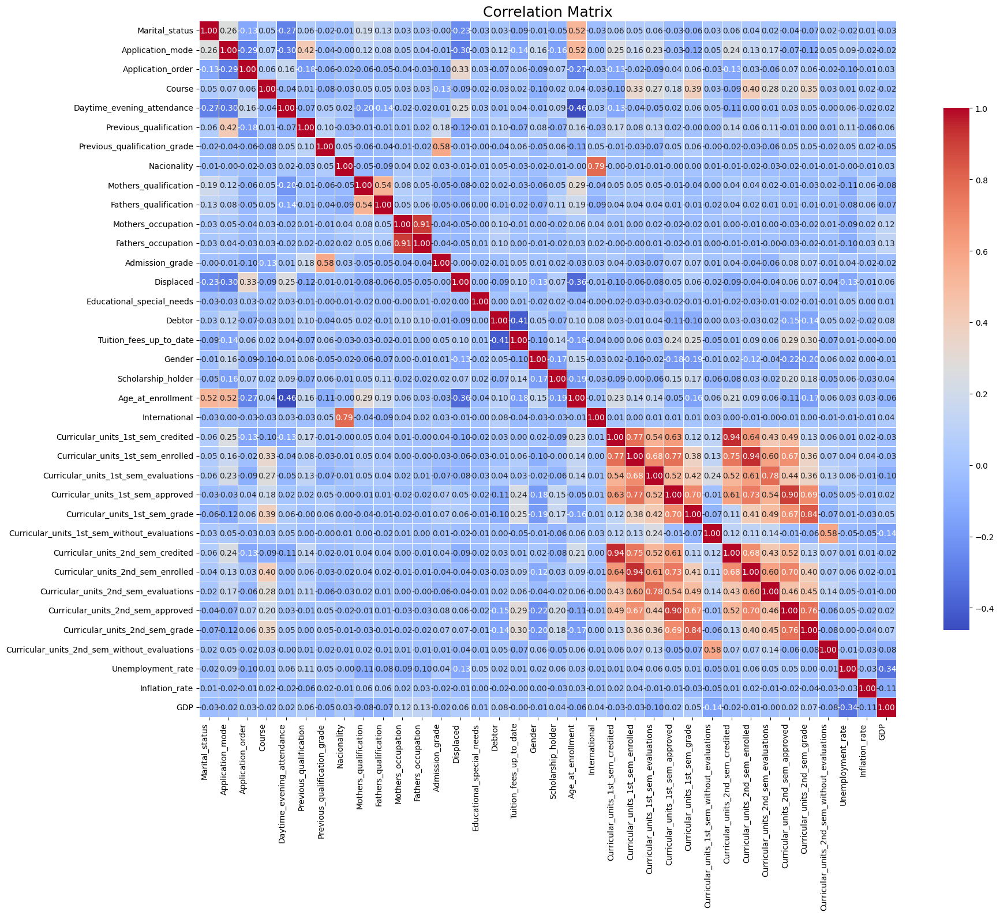

In [6]:
corr_matrix = df.corr(numeric_only=True)

plt.figure(figsize=(20, 16))

sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.75}
)

plt.title("Correlation Matrix", fontsize=18)
plt.xticks(rotation=90, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

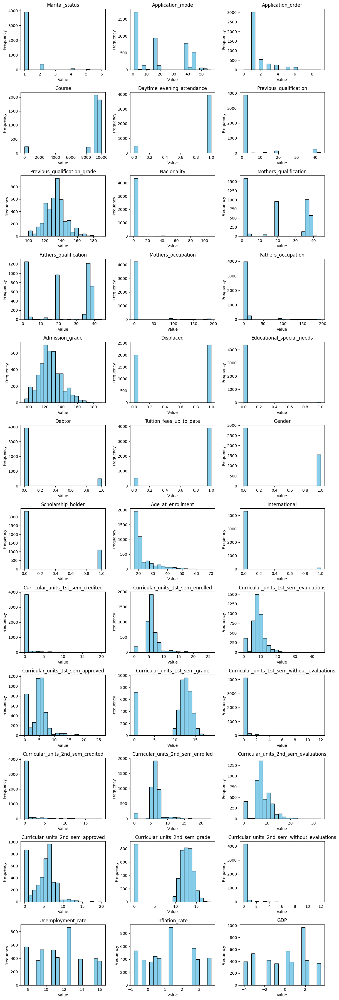

In [7]:
numeric_cols = df.select_dtypes(include='number').columns

n_cols = 3
n_rows = -(-len(numeric_cols) // n_cols)

plt.figure(figsize=(n_cols * 4, n_rows * 3))

for i, col in enumerate(numeric_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    plt.hist(df[col], bins=20, color='skyblue', edgecolor='black')
    plt.title(col)
    plt.xlabel('Value')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [8]:
df['Status'].value_counts(normalize=True)

,proportion
Status,
Graduate,0.499322
Dropout,0.321203
Enrolled,0.179476


Sekitar 32% dari total siswa tergolong dalam kategori dropout

 STUDENT DROPOUT ANALYSIS TOOLKIT READY!
Untuk menjalankan analisis lengkap:
🎓 STARTING COMPREHENSIVE STUDENT DROPOUT ANALYSIS
Dataset shape: (4424, 37)
Target variable distribution:
Status
Graduate    2209
Dropout     1421
Enrolled     794
Name: count, dtype: int64
Dropout rate: 32.12%
=== CATEGORICAL VARIABLES ANALYSIS ===
Analyzing 11 categorical variables...

--- Analyzing Marital_status ---


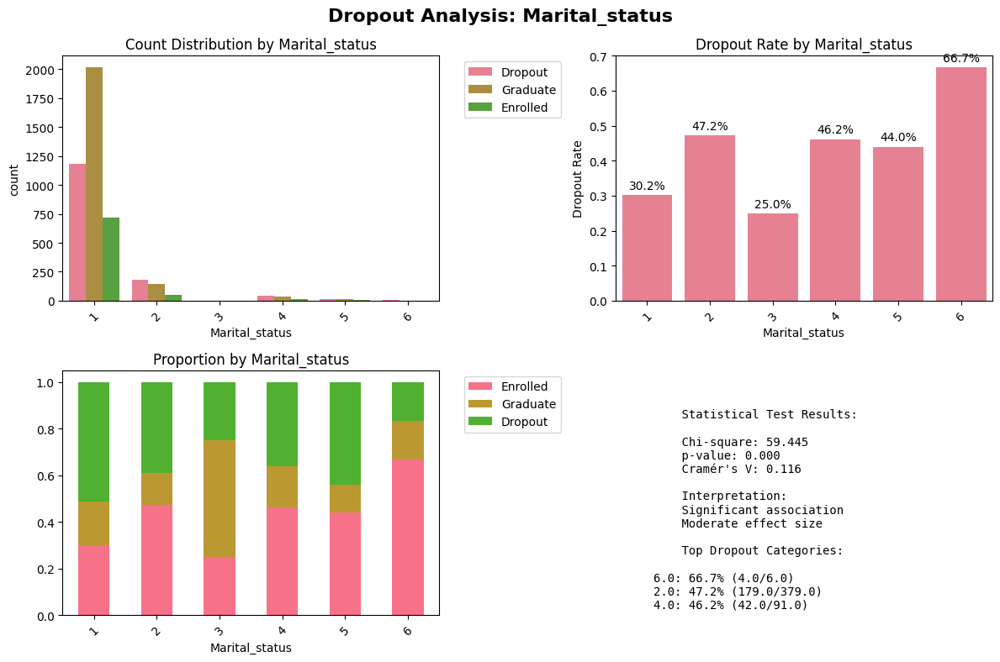


--- Analyzing Application_order ---


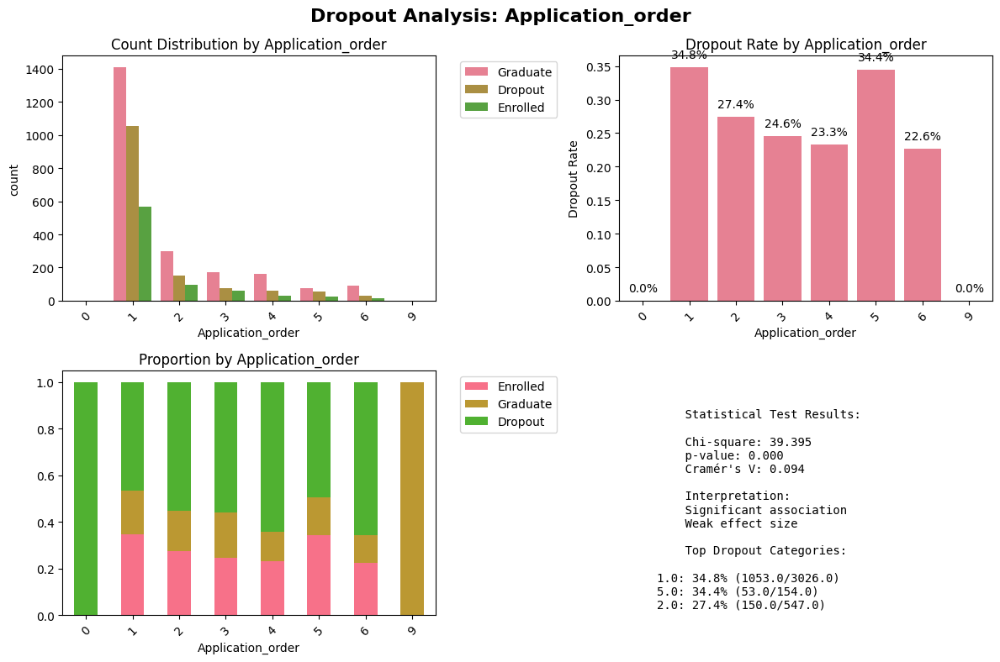


--- Analyzing Daytime_evening_attendance ---


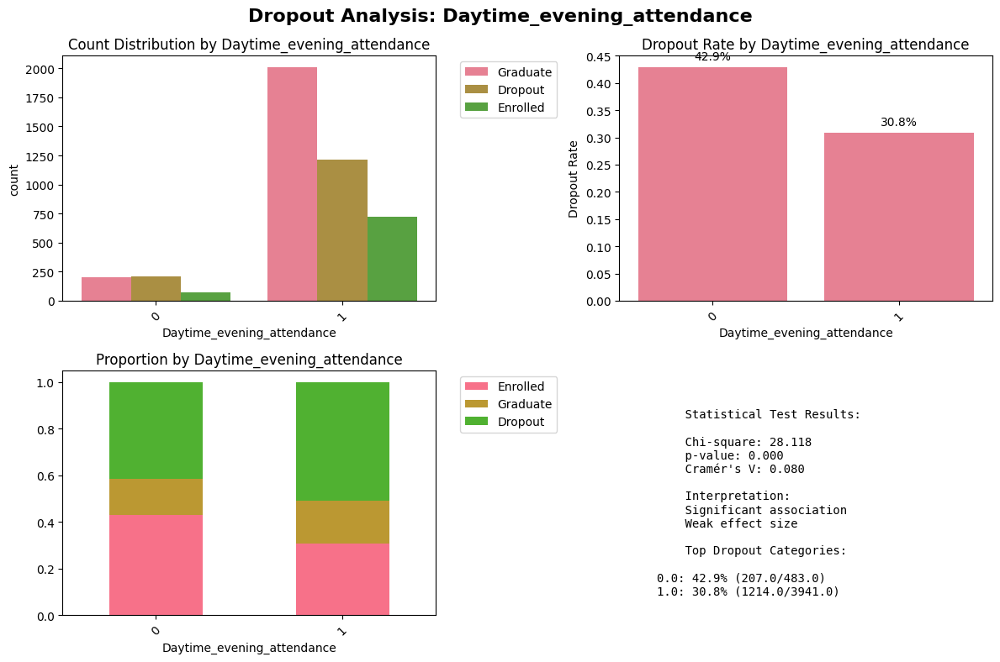


--- Analyzing Displaced ---


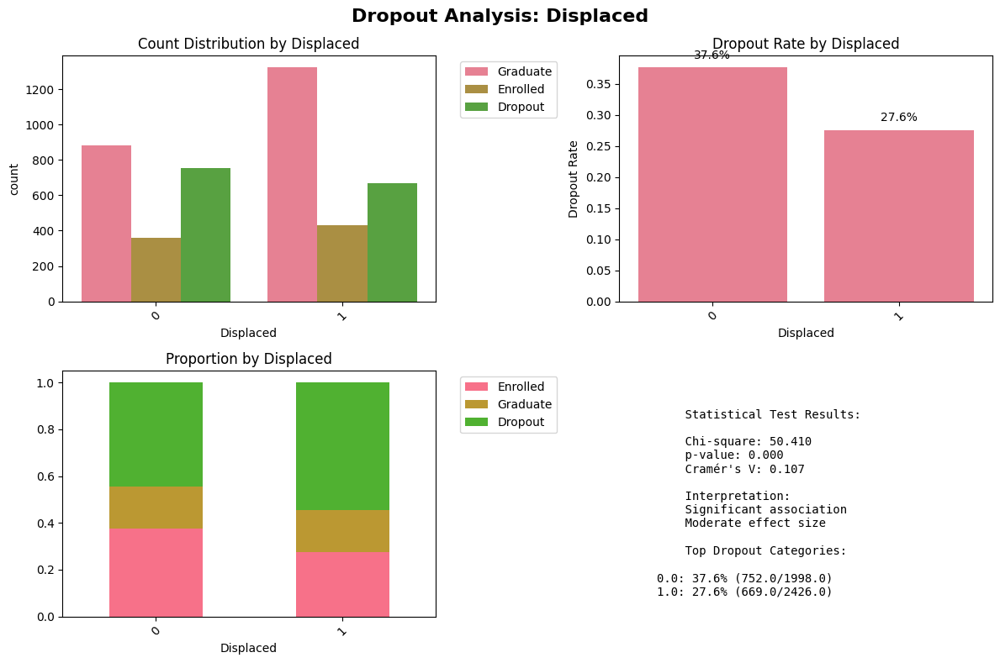


--- Analyzing Educational_special_needs ---


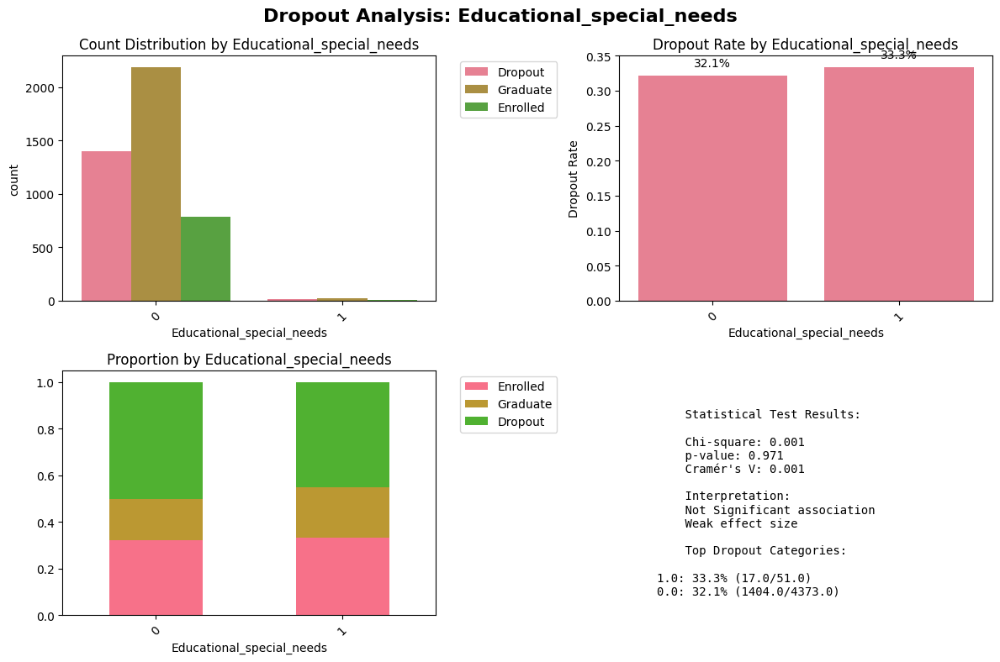


--- Analyzing Debtor ---


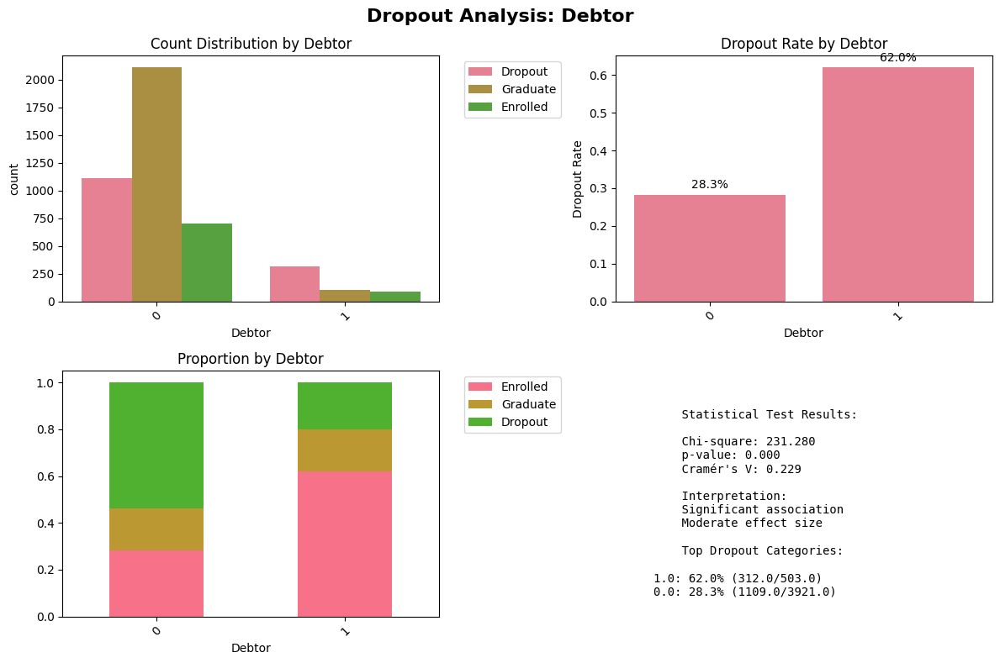


--- Analyzing Tuition_fees_up_to_date ---


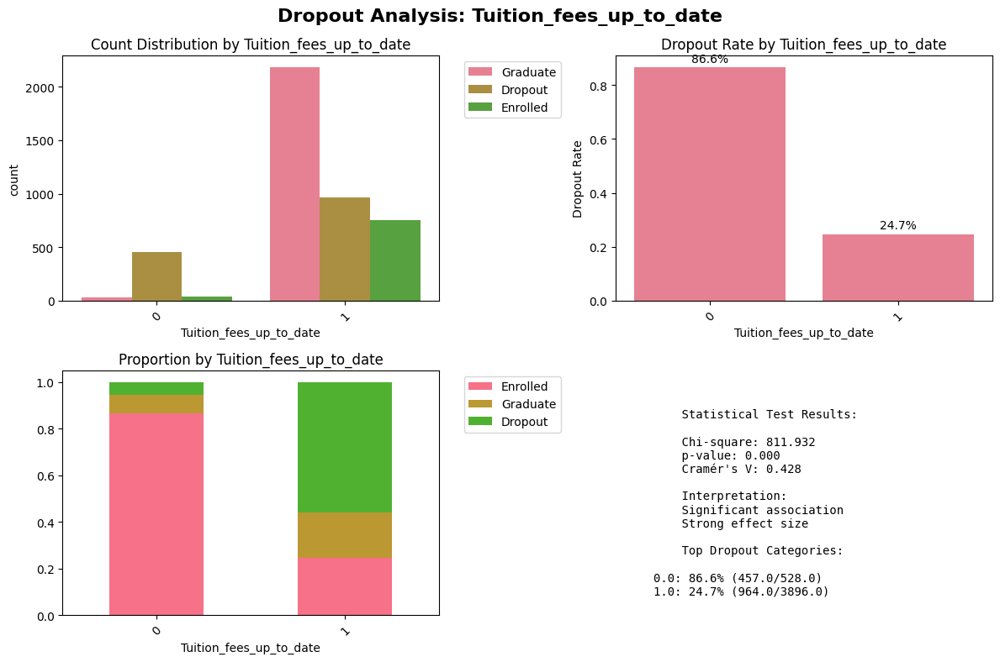


--- Analyzing Gender ---


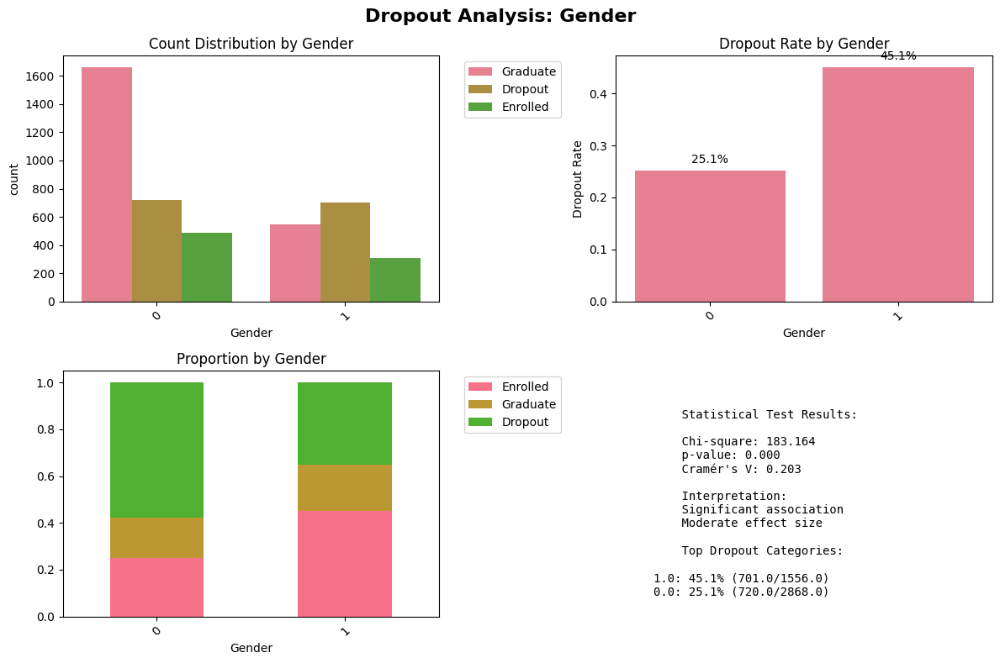


--- Analyzing Scholarship_holder ---


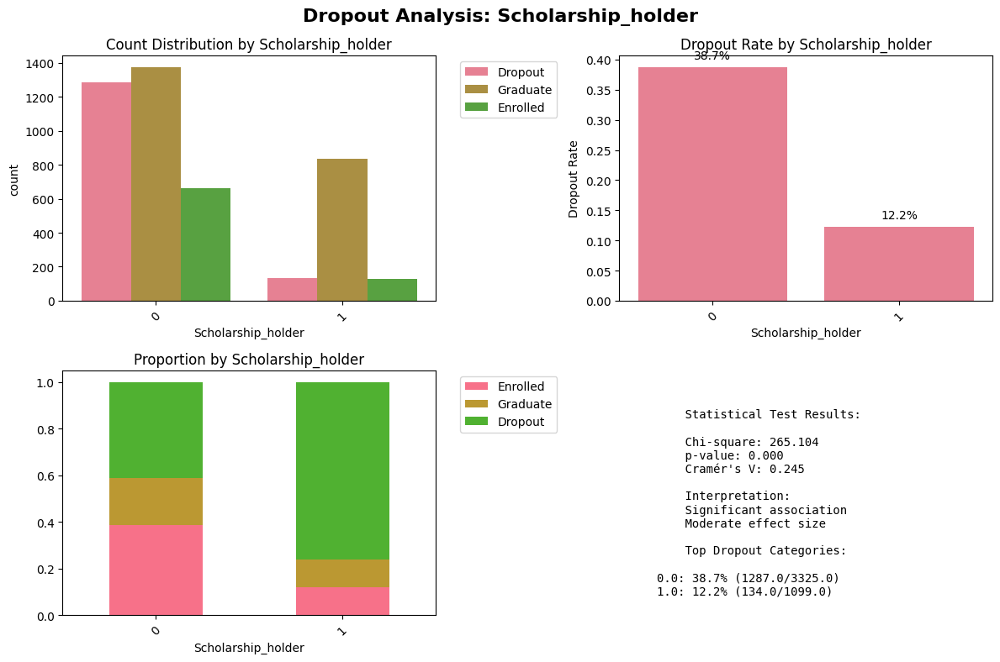


--- Analyzing International ---


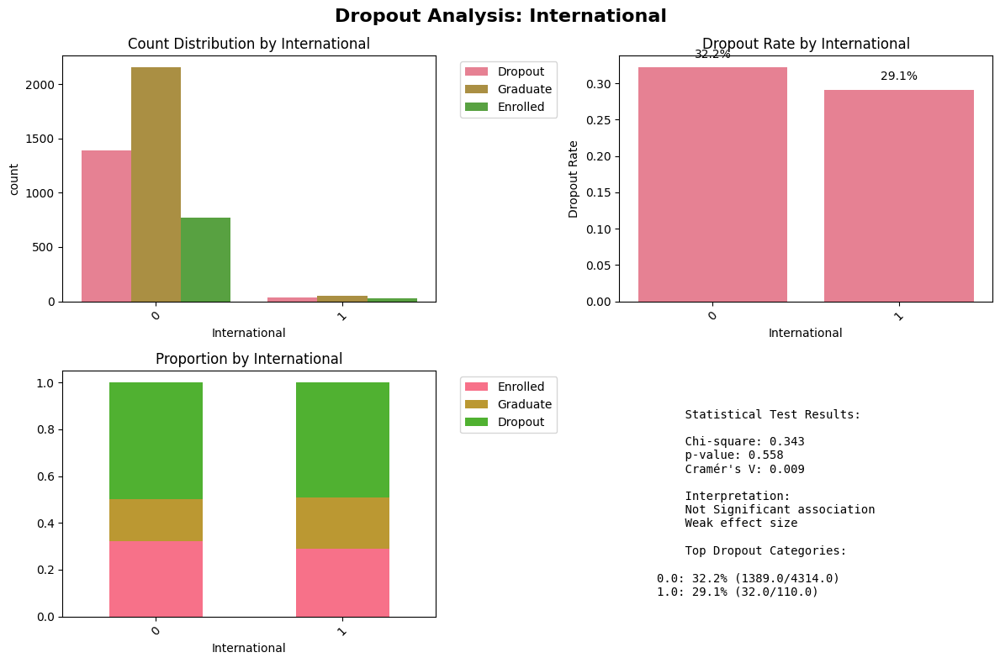


--- Analyzing Inflation_rate ---


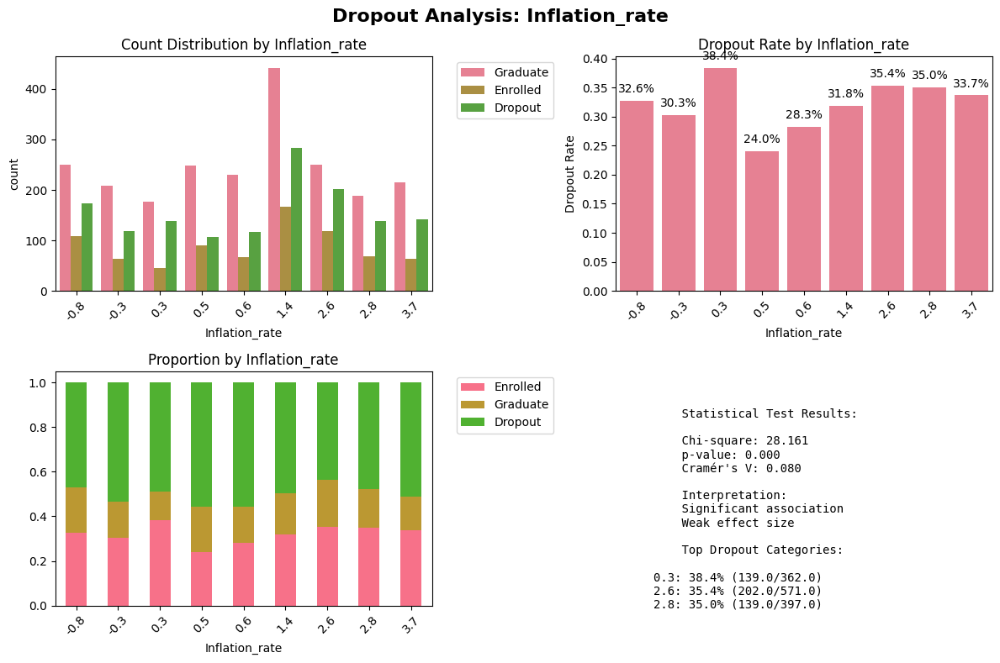


=== NUMERICAL VARIABLES ANALYSIS ===
Analyzing 25 numerical variables...

--- Analyzing Application_mode ---


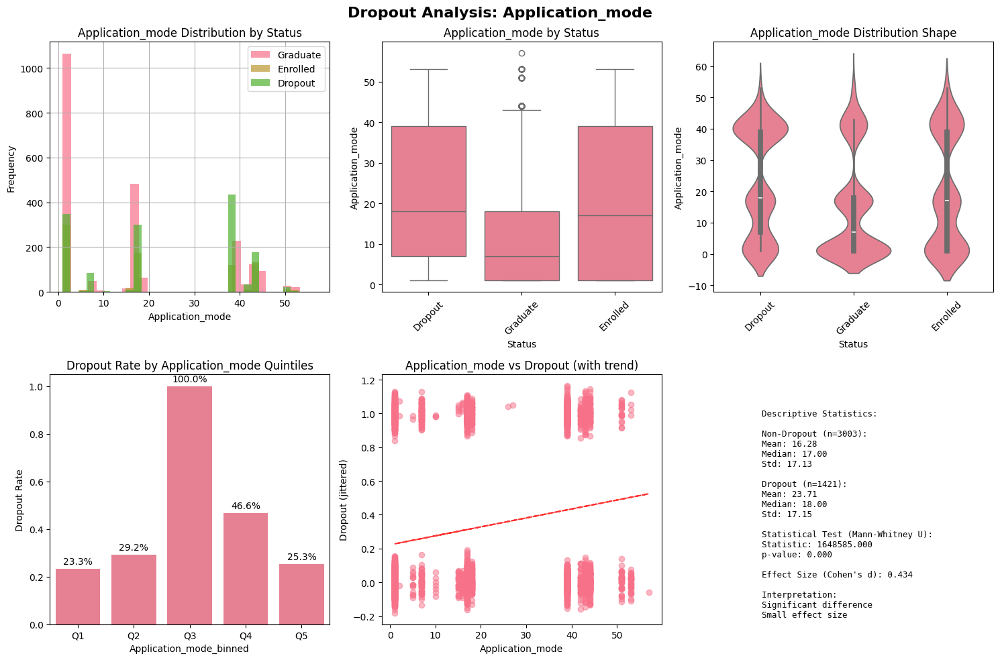


--- Analyzing Course ---


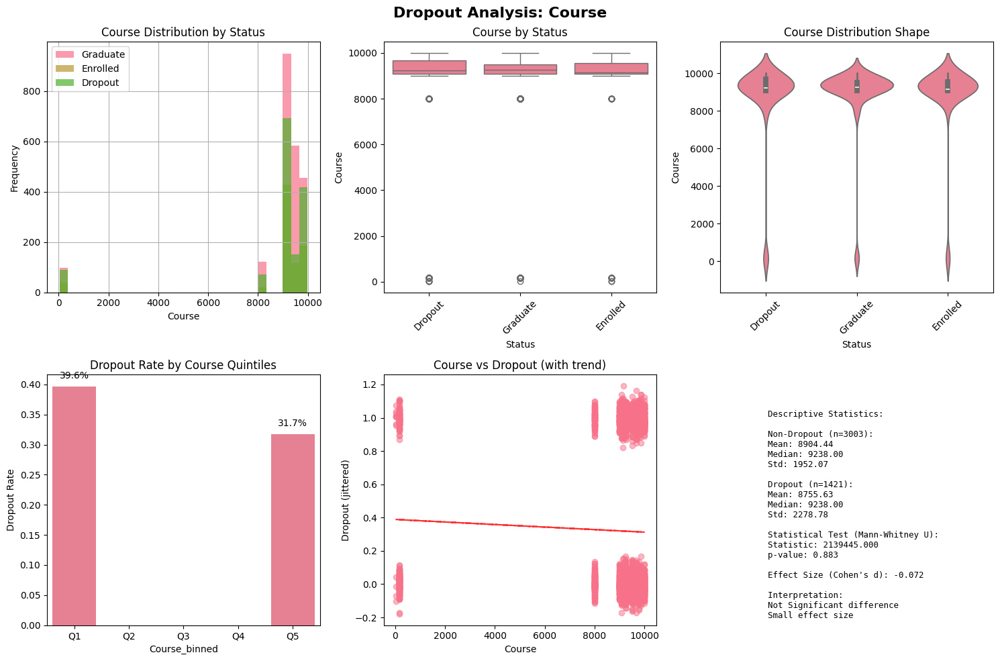


--- Analyzing Previous_qualification ---


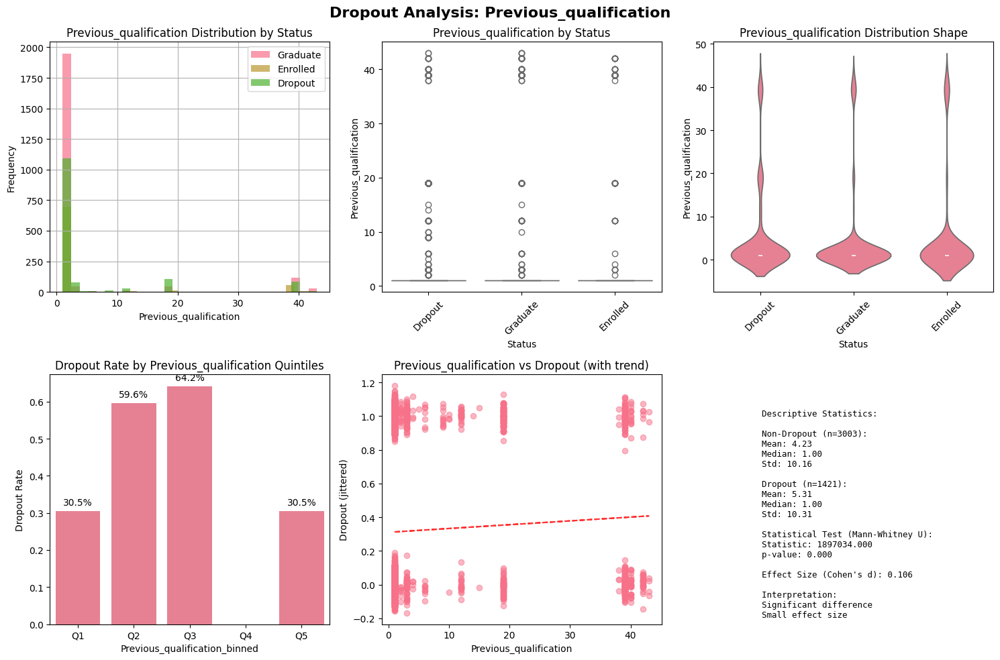


--- Analyzing Previous_qualification_grade ---


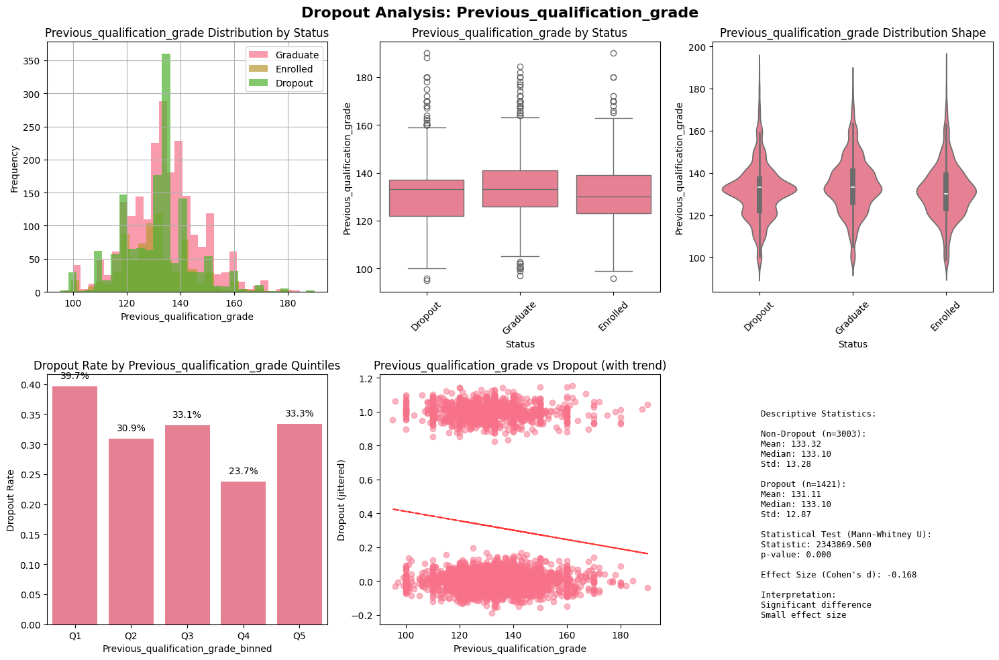


--- Analyzing Nacionality ---


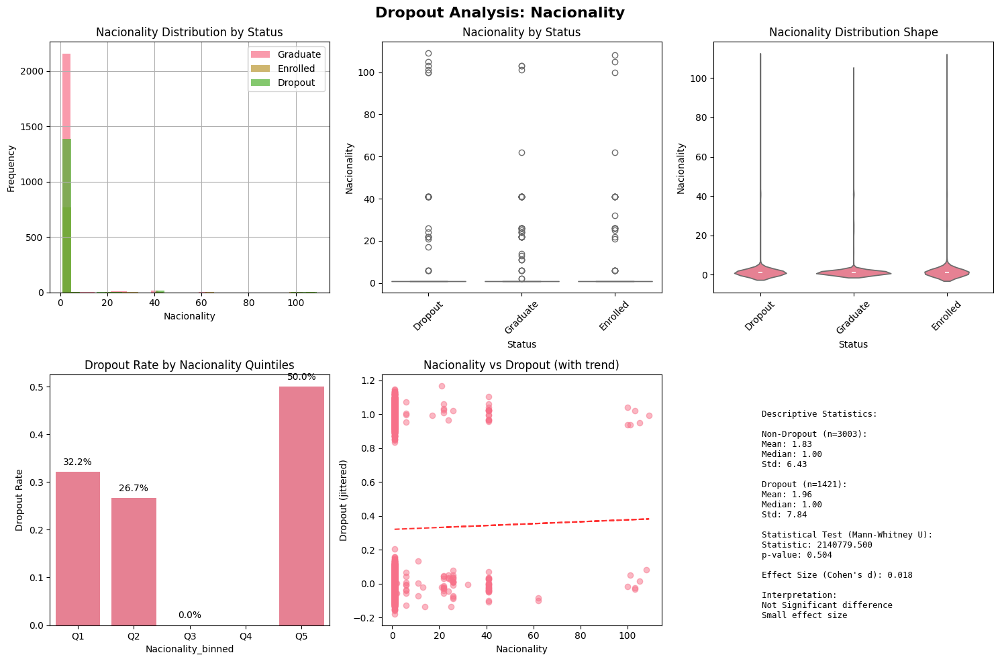


--- Analyzing Mothers_qualification ---


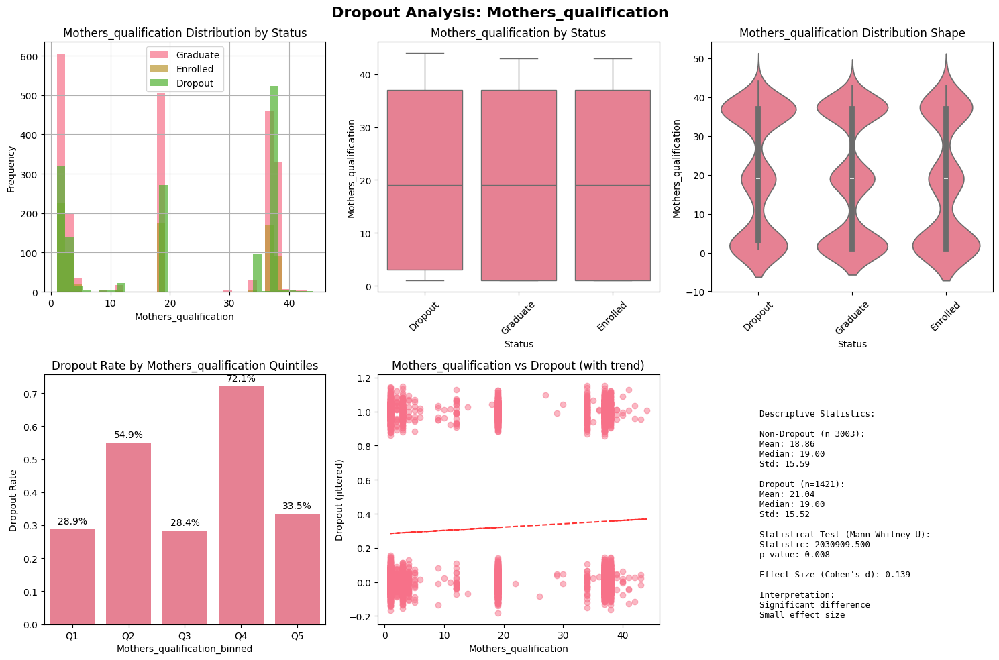


--- Analyzing Fathers_qualification ---


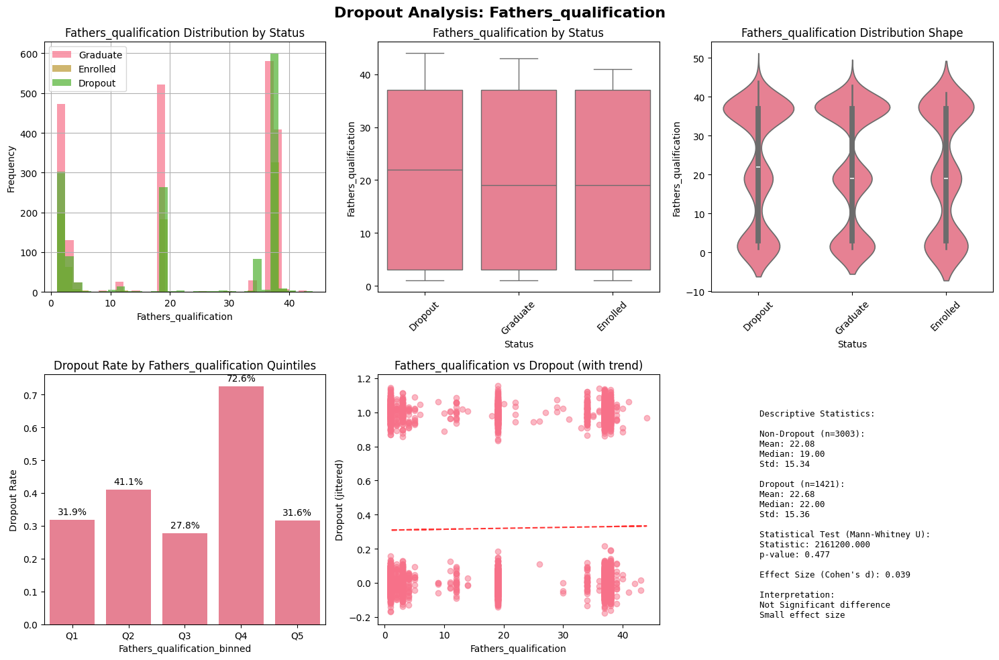


--- Analyzing Mothers_occupation ---


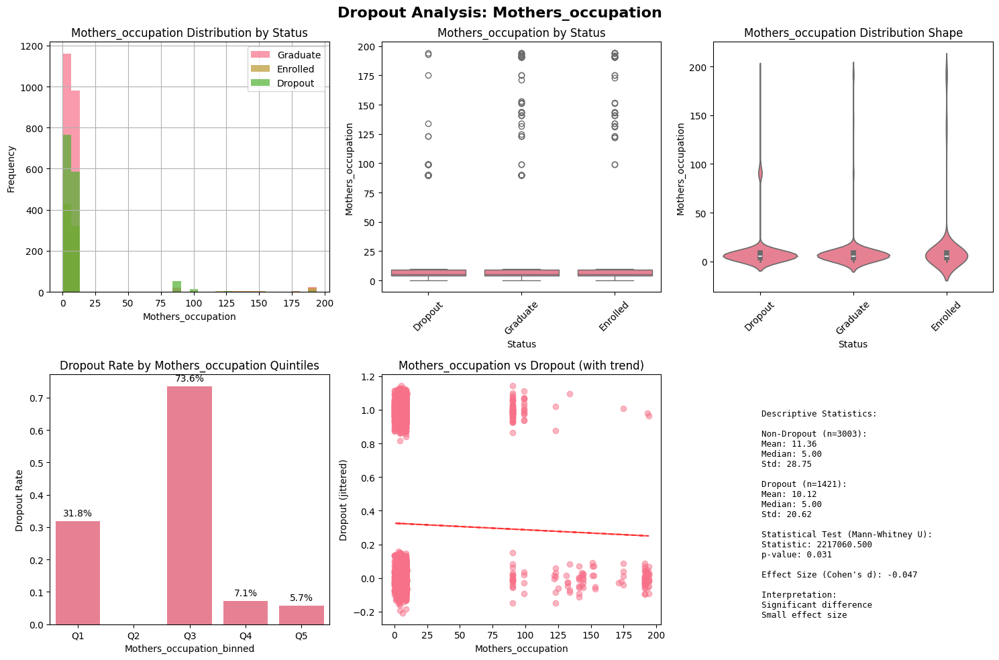


--- Analyzing Fathers_occupation ---


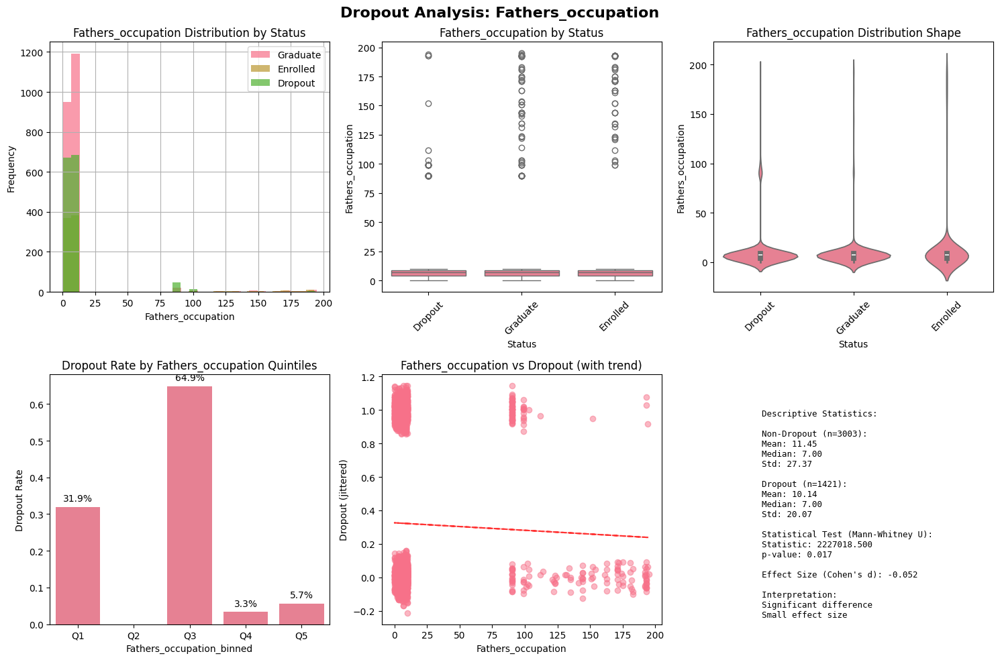


--- Analyzing Admission_grade ---


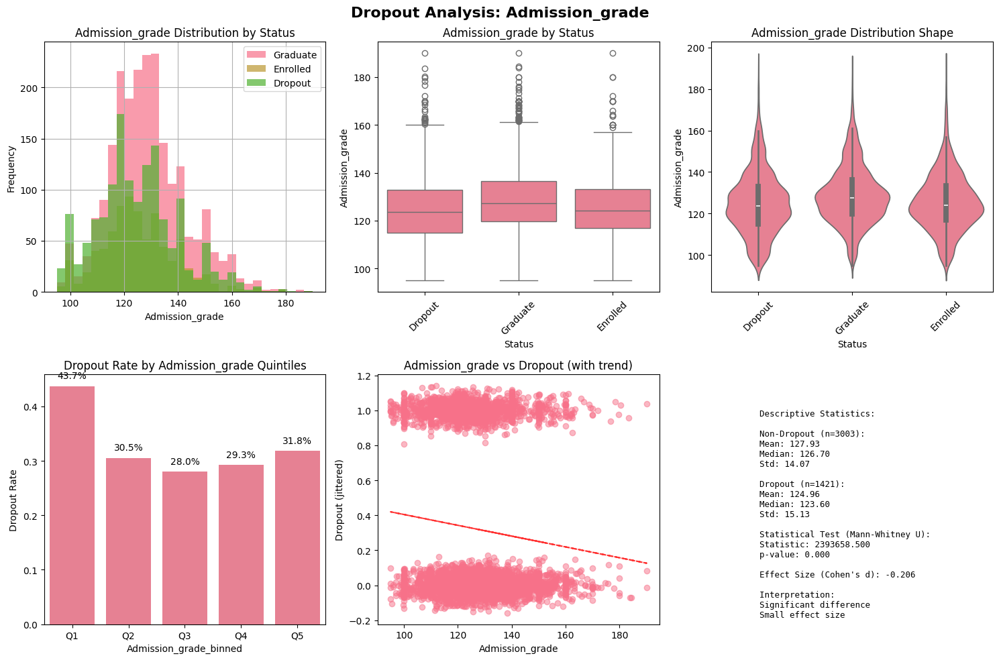


--- Analyzing Age_at_enrollment ---


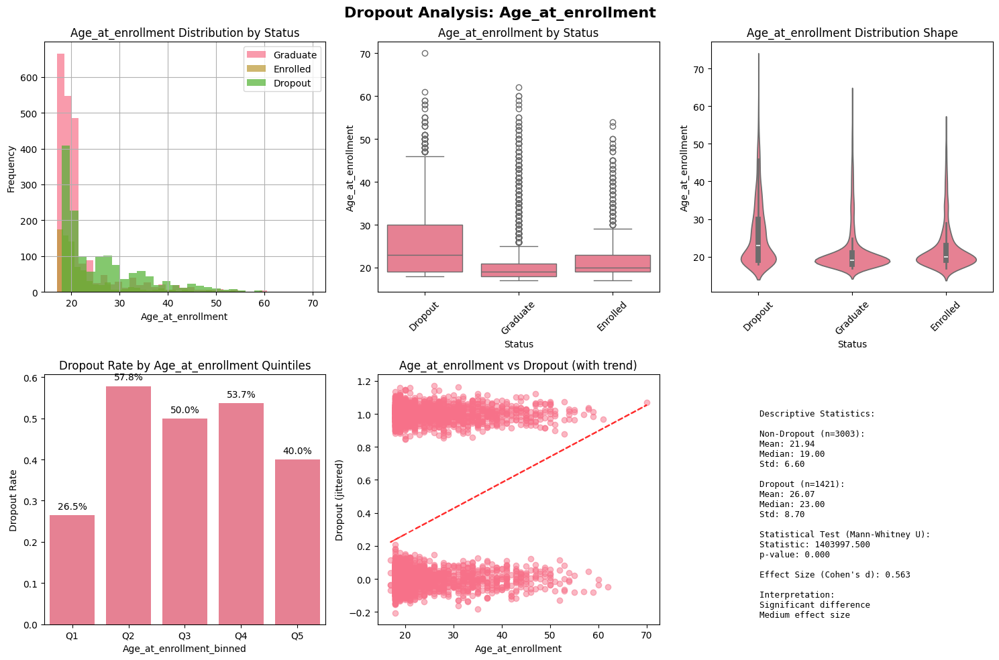


--- Analyzing Curricular_units_1st_sem_credited ---


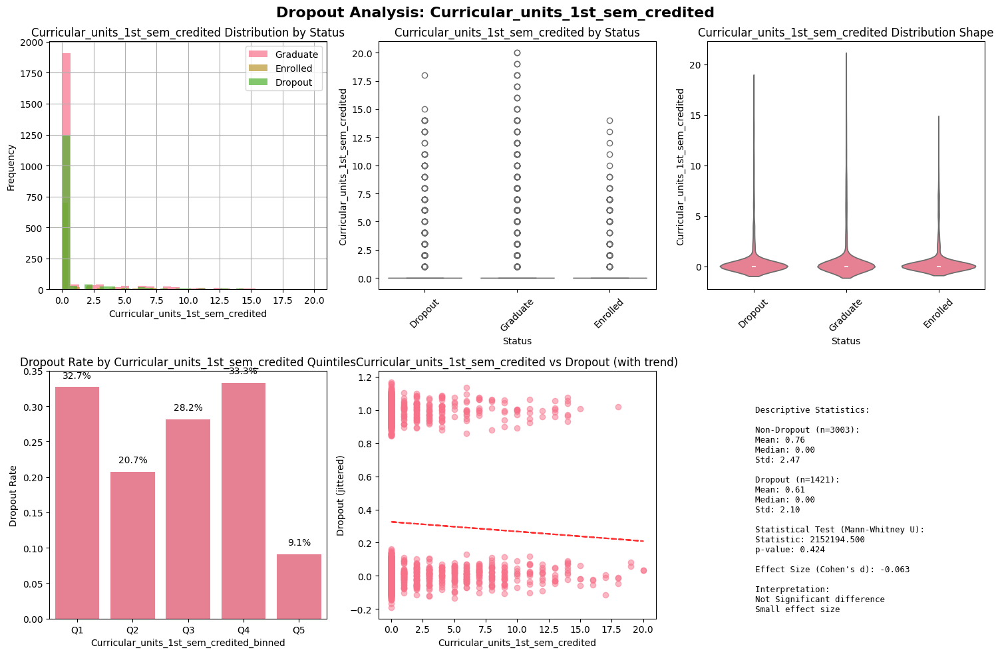


--- Analyzing Curricular_units_1st_sem_enrolled ---


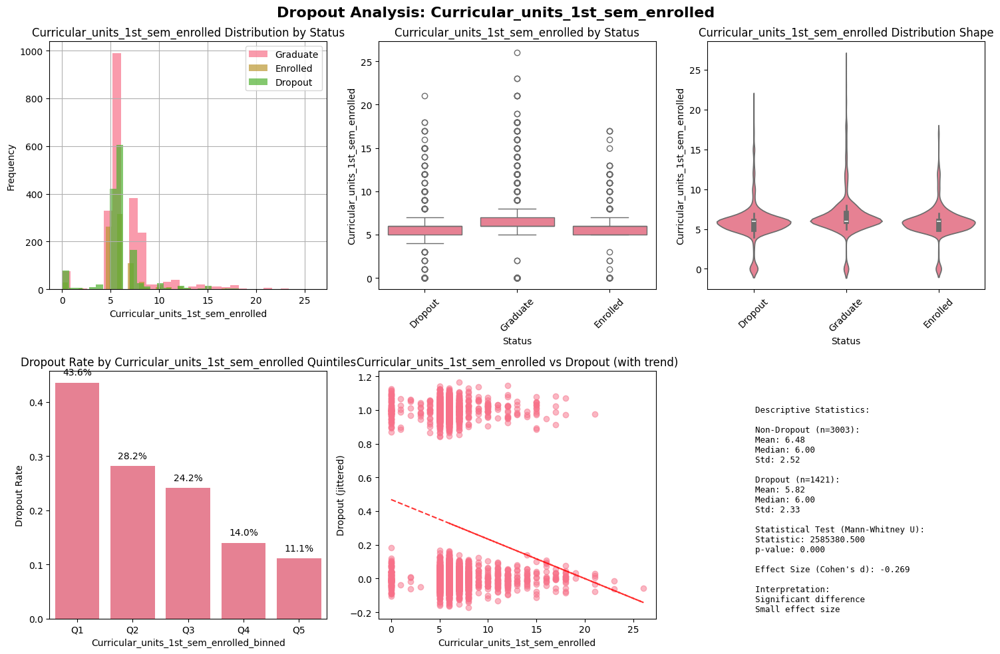


--- Analyzing Curricular_units_1st_sem_evaluations ---


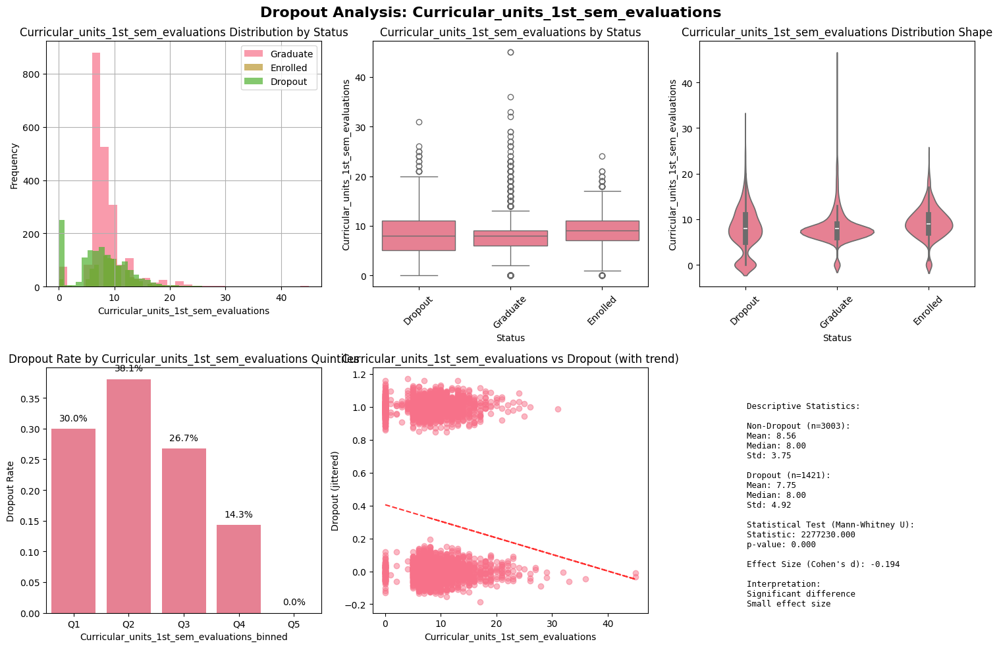


--- Analyzing Curricular_units_1st_sem_approved ---


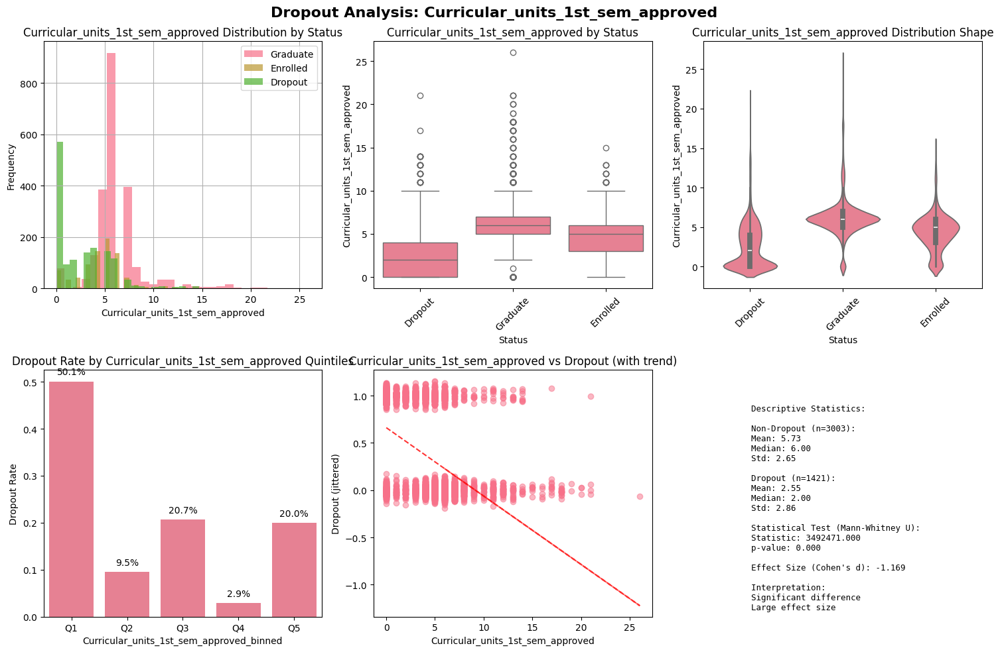


--- Analyzing Curricular_units_1st_sem_grade ---


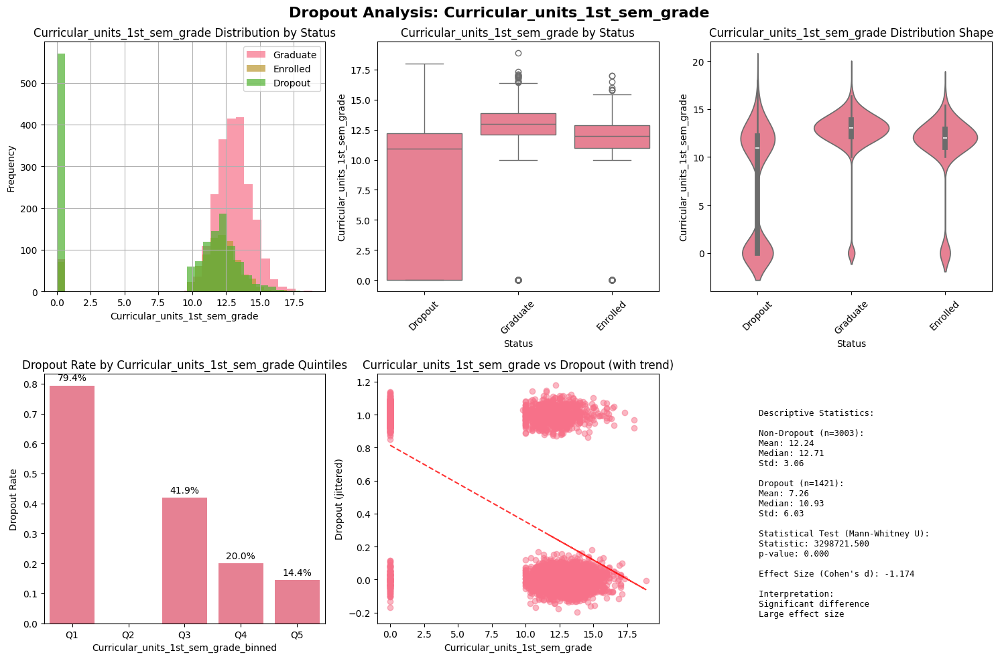


--- Analyzing Curricular_units_1st_sem_without_evaluations ---


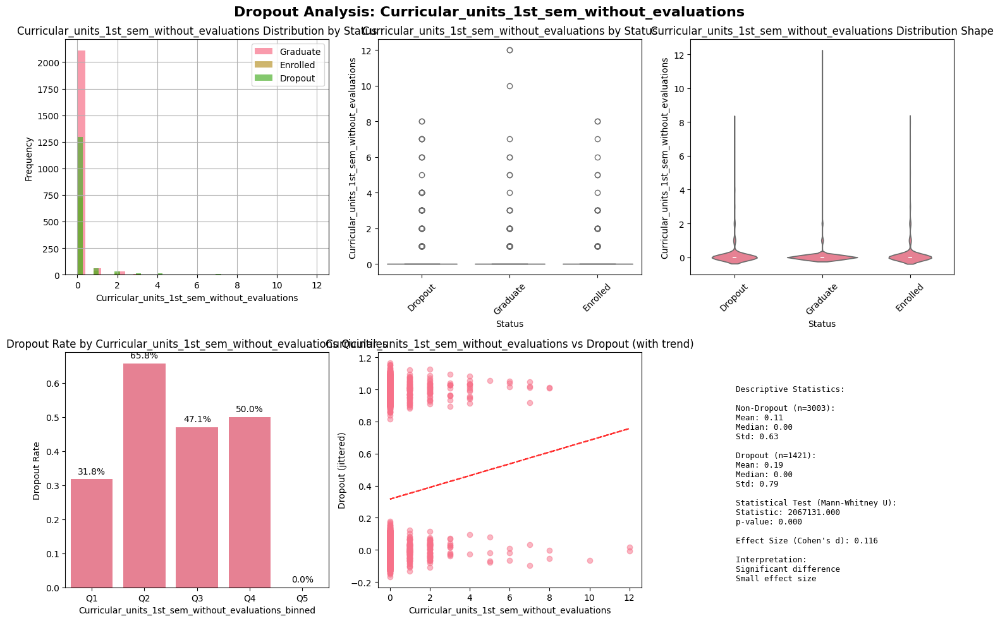


--- Analyzing Curricular_units_2nd_sem_credited ---


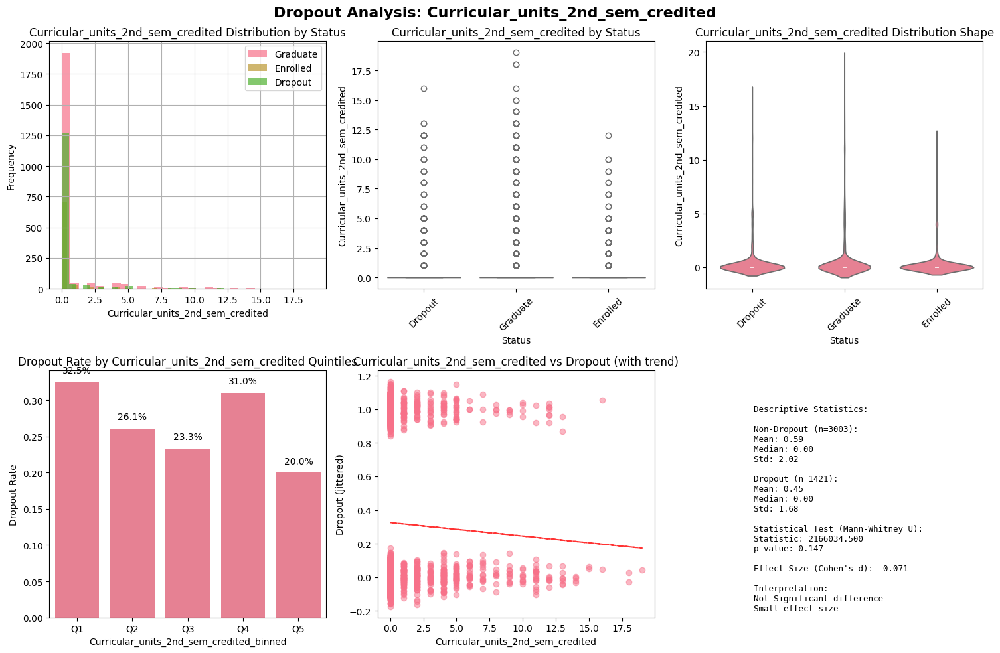


--- Analyzing Curricular_units_2nd_sem_enrolled ---


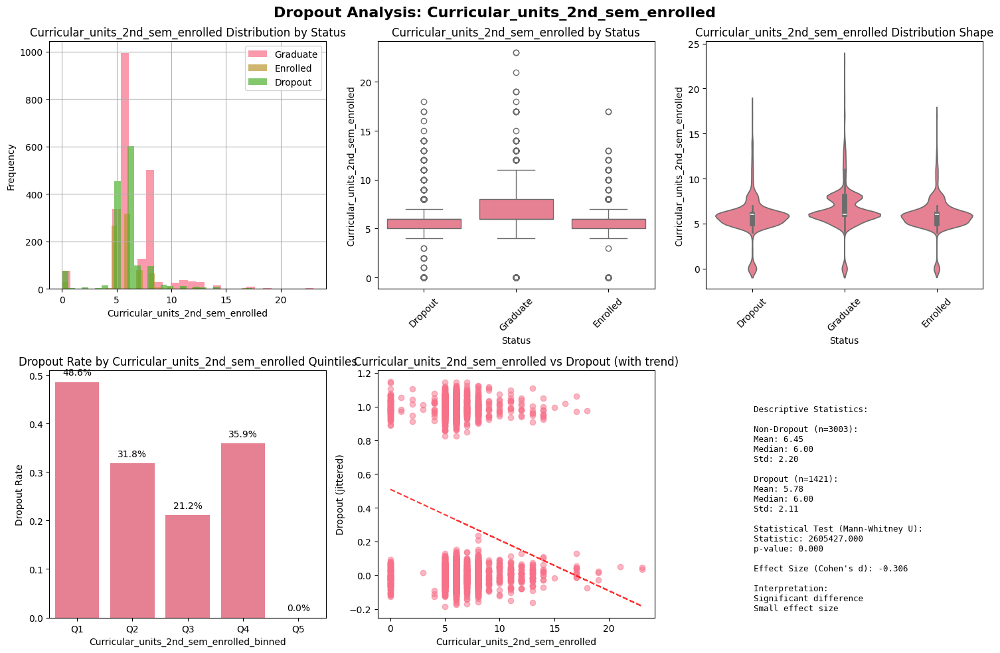


--- Analyzing Curricular_units_2nd_sem_evaluations ---


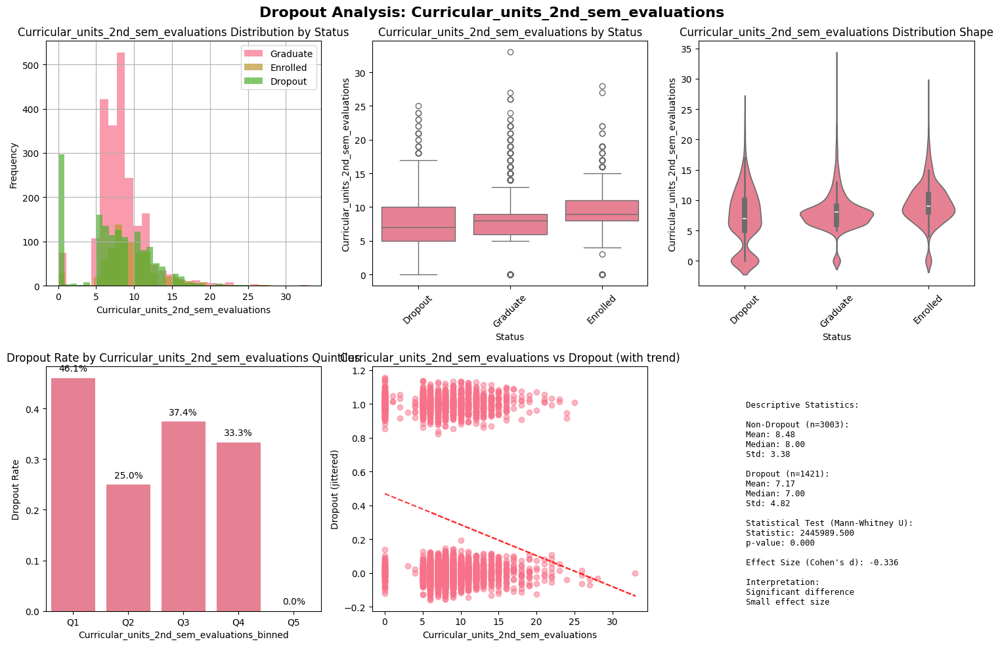


--- Analyzing Curricular_units_2nd_sem_approved ---


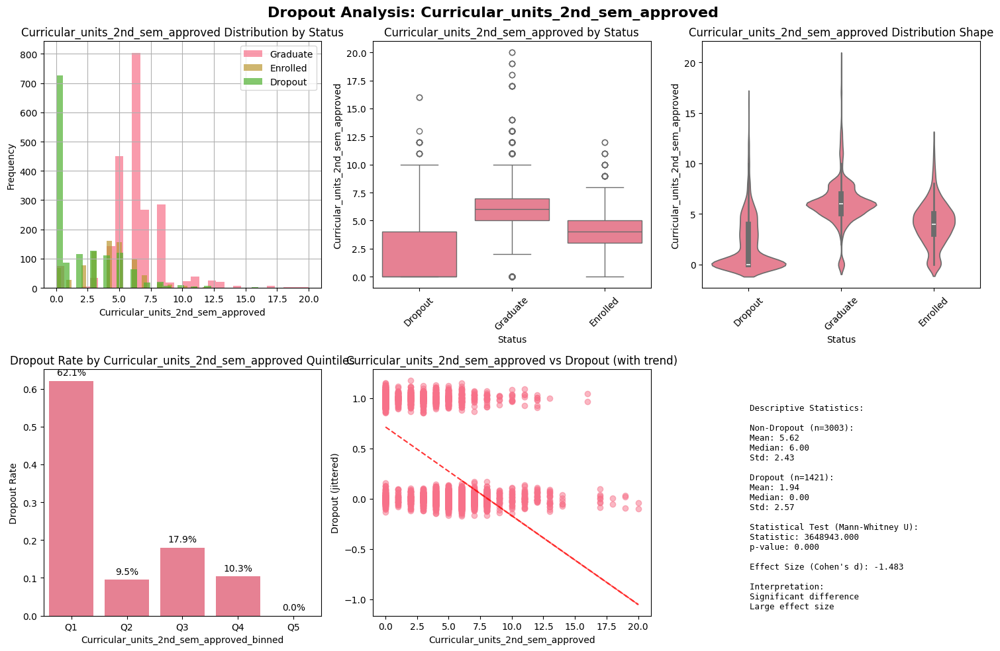


--- Analyzing Curricular_units_2nd_sem_grade ---


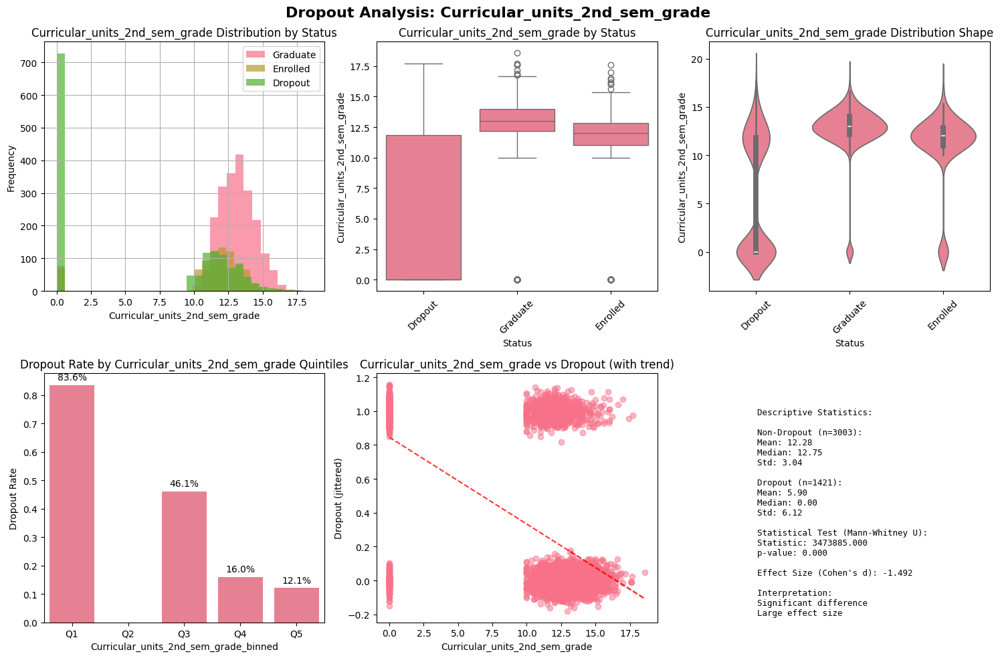


--- Analyzing Curricular_units_2nd_sem_without_evaluations ---


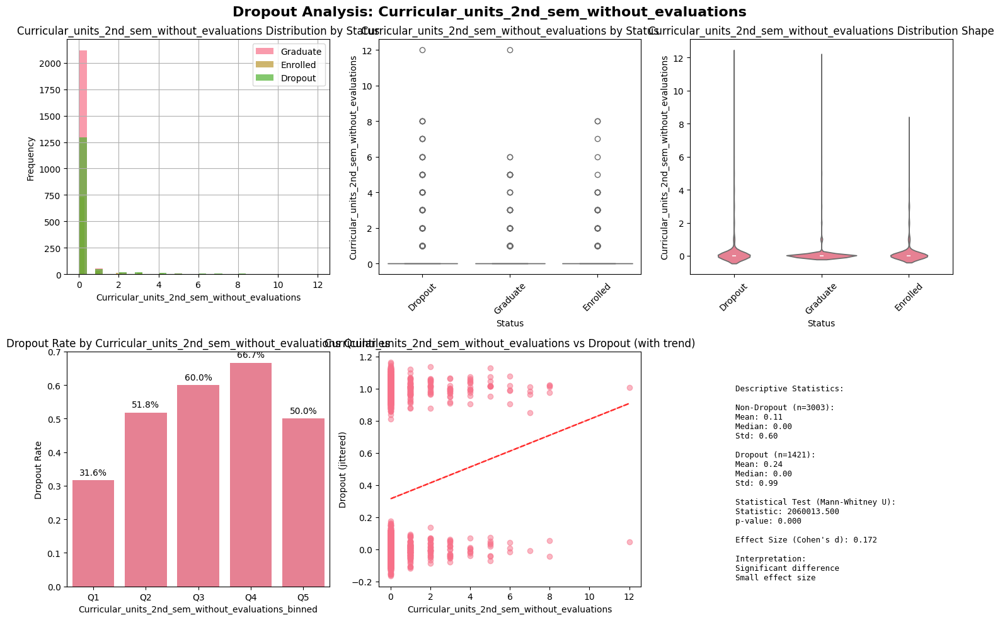


--- Analyzing Unemployment_rate ---


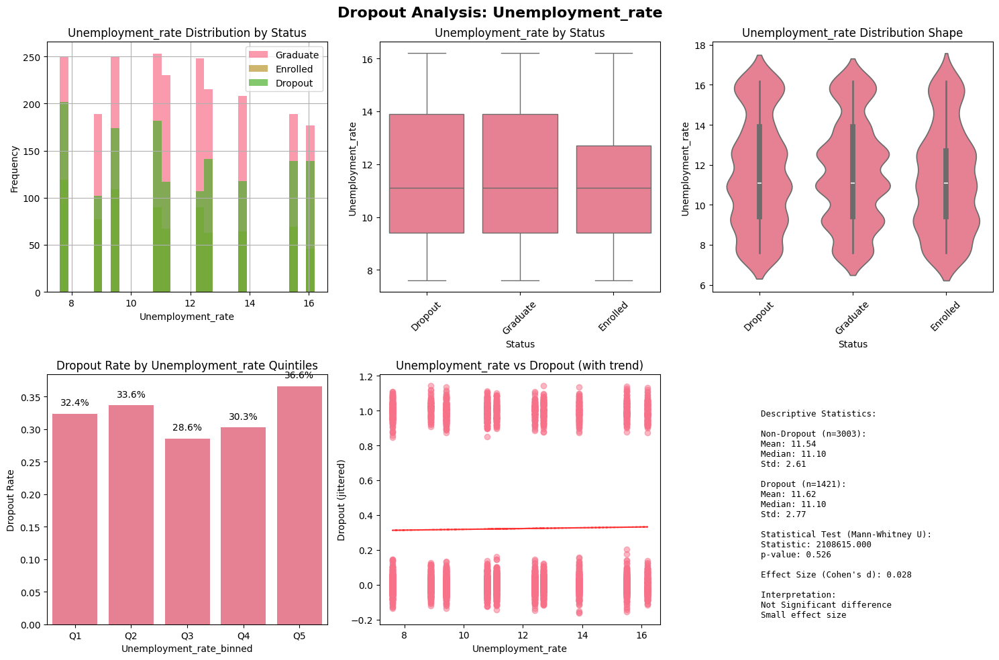


--- Analyzing GDP ---


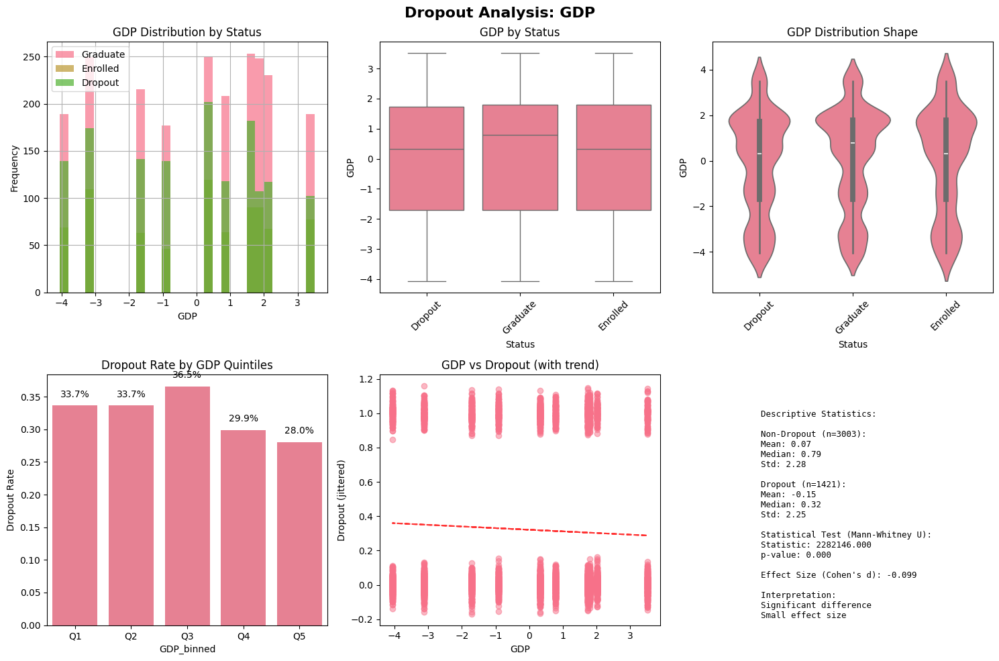

=== COMPREHENSIVE DROPOUT INSIGHTS SUMMARY WITH STATISTICAL TESTING ===

1. CATEGORICAL VARIABLES INSIGHTS:

        Marital_status: SIGNIFICANT
        - Highest dropout: 6.0 (66.7%)
        - Lowest dropout: 3.0 (25.0%)
        - Range: 41.7%
        - Chi-square p-value: 0.0000
        - Effect size (Cramér's V): 0.116 (Moderate)
        

        Application_order: SIGNIFICANT
        - Highest dropout: 1.0 (34.8%)
        - Lowest dropout: 0.0 (0.0%)
        - Range: 34.8%
        - Chi-square p-value: 0.0000
        - Effect size (Cramér's V): 0.094 (Weak)
        

        Daytime_evening_attendance: SIGNIFICANT
        - Highest dropout: 0.0 (42.9%)
        - Lowest dropout: 1.0 (30.8%)
        - Range: 12.1%
        - Chi-square p-value: 0.0000
        - Effect size (Cramér's V): 0.080 (Weak)
        

        Displaced: SIGNIFICANT
        - Highest dropout: 0.0 (37.6%)
        - Lowest dropout: 1.0 (27.6%)
        - Range: 10.1%
        - Chi-square p-value: 0.0000
        -

In [9]:
# Fungsi untuk analisis categorical vs dropout
def analyze_categorical_dropout(df, col, figsize=(12, 8)):
    """
    Analisis dropout rate untuk variabel kategorikal
    """
    fig, axes = plt.subplots(2, 2, figsize=figsize)
    fig.suptitle(f'Dropout Analysis: {col}', fontsize=16, fontweight='bold')

    # Convert Status to binary (1 for Dropout, 0 for others)
    df_temp = df.copy()
    df_temp['Dropout_Binary'] = (df_temp['Status'] == 'Dropout').astype(int)

    # 1. Count plot
    sns.countplot(data=df, x=col, hue='Status', ax=axes[0,0])
    axes[0,0].set_title(f'Count Distribution by {col}')
    axes[0,0].tick_params(axis='x', rotation=45)
    axes[0,0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # 2. Dropout rate by category
    dropout_rates = df_temp.groupby(col)['Dropout_Binary'].agg(['count', 'sum', 'mean']).reset_index()
    dropout_rates.columns = [col, 'Total_Students', 'Dropouts', 'Dropout_Rate']

    sns.barplot(data=dropout_rates, x=col, y='Dropout_Rate', ax=axes[0,1])
    axes[0,1].set_title(f'Dropout Rate by {col}')
    axes[0,1].tick_params(axis='x', rotation=45)
    axes[0,1].set_ylabel('Dropout Rate')

    # Add percentage labels on bars
    for i, v in enumerate(dropout_rates['Dropout_Rate']):
        axes[0,1].text(i, v + 0.01, f'{v:.1%}', ha='center', va='bottom')

    # 3. Proportion plot
    prop_data = df.groupby([col, 'Status']).size().unstack(fill_value=0)
    prop_data_pct = prop_data.div(prop_data.sum(axis=1), axis=0)
    prop_data_pct.plot(kind='bar', stacked=True, ax=axes[1,0])
    axes[1,0].set_title(f'Proportion by {col}')
    axes[1,0].tick_params(axis='x', rotation=45)
    axes[1,0].legend(['Enrolled', 'Graduate', 'Dropout'], bbox_to_anchor=(1.05, 1), loc='upper left')

    # 4. Statistical summary
    axes[1,1].axis('off')

    # Chi-square test
    contingency_table = pd.crosstab(df_temp[col], df_temp['Dropout_Binary'])
    chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)

    # Cramér's V (effect size)
    n = contingency_table.sum().sum()
    cramers_v = np.sqrt(chi2 / (n * (min(contingency_table.shape) - 1)))

    # Text summary
    summary_text = f"""
    Statistical Test Results:

    Chi-square: {chi2:.3f}
    p-value: {p_value:.3f}
    Cramér's V: {cramers_v:.3f}

    Interpretation:
    {'Significant' if p_value < 0.05 else 'Not Significant'} association
    {'Strong' if cramers_v > 0.3 else 'Moderate' if cramers_v > 0.1 else 'Weak'} effect size

    Top Dropout Categories:
    """

    top_categories = dropout_rates.nlargest(3, 'Dropout_Rate')
    for _, row in top_categories.iterrows():
        summary_text += f"\n{row[col]}: {row['Dropout_Rate']:.1%} ({row['Dropouts']}/{row['Total_Students']})"

    axes[1,1].text(0.1, 0.9, summary_text, transform=axes[1,1].transAxes,
                   verticalalignment='top', fontsize=10, fontfamily='monospace')

    plt.tight_layout()
    plt.show()

    # Return enhanced results with statistical info
    statistical_results = {
        'dropout_rates': dropout_rates,
        'chi2': chi2,
        'p_value': p_value,
        'cramers_v': cramers_v,
        'is_significant': p_value < 0.05,
        'effect_size_category': 'Strong' if cramers_v > 0.3 else 'Moderate' if cramers_v > 0.1 else 'Weak'
    }

    return statistical_results

# Fungsi untuk analisis numerical vs dropout
def analyze_numerical_dropout(df, col, bins=None, figsize=(15, 10)):
    """
    Analisis dropout untuk variabel numerik
    """
    fig, axes = plt.subplots(2, 3, figsize=figsize)
    fig.suptitle(f'Dropout Analysis: {col}', fontsize=16, fontweight='bold')

    # Convert Status to binary
    df_temp = df.copy()
    df_temp['Dropout_Binary'] = (df_temp['Status'] == 'Dropout').astype(int)

    # 1. Distribution comparison
    df[df['Status']=='Graduate'][col].hist(alpha=0.7, bins=30, label='Graduate', ax=axes[0,0])
    df[df['Status']=='Enrolled'][col].hist(alpha=0.7, bins=30, label='Enrolled', ax=axes[0,0])
    df[df['Status']=='Dropout'][col].hist(alpha=0.7, bins=30, label='Dropout', ax=axes[0,0])
    axes[0,0].set_title(f'{col} Distribution by Status')
    axes[0,0].legend()
    axes[0,0].set_xlabel(col)
    axes[0,0].set_ylabel('Frequency')

    # 2. Box plot
    sns.boxplot(data=df, x='Status', y=col, ax=axes[0,1])
    axes[0,1].set_title(f'{col} by Status')
    axes[0,1].tick_params(axis='x', rotation=45)

    # 3. Violin plot
    sns.violinplot(data=df, x='Status', y=col, ax=axes[0,2])
    axes[0,2].set_title(f'{col} Distribution Shape')
    axes[0,2].tick_params(axis='x', rotation=45)

    # 4. Binned analysis (focus on dropout vs non-dropout)
    if bins is None:
        bins = 5

    df_temp[f'{col}_binned'] = pd.cut(df_temp[col], bins=bins, labels=[f'Q{i+1}' for i in range(bins)])

    binned_analysis = df_temp.groupby(f'{col}_binned')['Dropout_Binary'].agg(['count', 'sum', 'mean']).reset_index()
    binned_analysis.columns = [f'{col}_binned', 'Total_Students', 'Dropouts', 'Dropout_Rate']

    sns.barplot(data=binned_analysis, x=f'{col}_binned', y='Dropout_Rate', ax=axes[1,0])
    axes[1,0].set_title(f'Dropout Rate by {col} Quintiles')
    axes[1,0].set_ylabel('Dropout Rate')

    # Add percentage labels
    for i, v in enumerate(binned_analysis['Dropout_Rate']):
        axes[1,0].text(i, v + 0.01, f'{v:.1%}', ha='center', va='bottom')

    # 5. Scatter plot with trend
    df_temp['jittered_dropout'] = df_temp['Dropout_Binary'] + np.random.normal(0, 0.05, len(df_temp))
    axes[1,1].scatter(df_temp[col], df_temp['jittered_dropout'], alpha=0.5)

    # Add trend line
    z = np.polyfit(df_temp[col].dropna(), df_temp.loc[df_temp[col].notna(), 'Dropout_Binary'], 1)
    p = np.poly1d(z)
    axes[1,1].plot(df_temp[col].dropna(), p(df_temp[col].dropna()), "r--", alpha=0.8)
    axes[1,1].set_title(f'{col} vs Dropout (with trend)')
    axes[1,1].set_xlabel(col)
    axes[1,1].set_ylabel('Dropout (jittered)')

    # 6. Statistical summary
    axes[1,2].axis('off')

    # Statistical tests (compare dropout vs non-dropout)
    non_dropout_group = df_temp[df_temp['Dropout_Binary']==0][col].dropna()
    dropout_group = df_temp[df_temp['Dropout_Binary']==1][col].dropna()

    # T-test atau Mann-Whitney U test
    if len(dropout_group) > 3 and len(non_dropout_group) > 3:
        shapiro_non_dropout = stats.shapiro(non_dropout_group.sample(min(5000, len(non_dropout_group))))[1]
        shapiro_dropout = stats.shapiro(dropout_group.sample(min(5000, len(dropout_group))))[1]

        if shapiro_non_dropout > 0.05 and shapiro_dropout > 0.05:
            stat_test = stats.ttest_ind(non_dropout_group, dropout_group)
            test_name = "T-test"
        else:
            stat_test = stats.mannwhitneyu(non_dropout_group, dropout_group, alternative='two-sided')
            test_name = "Mann-Whitney U"

        # Effect size (Cohen's d)
        cohens_d = (dropout_group.mean() - non_dropout_group.mean()) / np.sqrt(((len(dropout_group)-1)*dropout_group.var() + (len(non_dropout_group)-1)*non_dropout_group.var()) / (len(dropout_group)+len(non_dropout_group)-2))
    else:
        stat_test = type('MockTest', (), {'statistic': 0, 'pvalue': 1})()
        test_name = "Insufficient data"
        cohens_d = 0

    summary_text = f"""
    Descriptive Statistics:

    Non-Dropout (n={len(non_dropout_group)}):
    Mean: {non_dropout_group.mean():.2f}
    Median: {non_dropout_group.median():.2f}
    Std: {non_dropout_group.std():.2f}

    Dropout (n={len(dropout_group)}):
    Mean: {dropout_group.mean():.2f}
    Median: {dropout_group.median():.2f}
    Std: {dropout_group.std():.2f}

    Statistical Test ({test_name}):
    Statistic: {stat_test.statistic:.3f}
    p-value: {stat_test.pvalue:.3f}

    Effect Size (Cohen's d): {cohens_d:.3f}

    Interpretation:
    {'Significant' if stat_test.pvalue < 0.05 else 'Not Significant'} difference
    {'Large' if abs(cohens_d) > 0.8 else 'Medium' if abs(cohens_d) > 0.5 else 'Small'} effect size
    """

    axes[1,2].text(0.1, 0.9, summary_text, transform=axes[1,2].transAxes,
                   verticalalignment='top', fontsize=9, fontfamily='monospace')

    plt.tight_layout()
    plt.show()

    # Return enhanced results with statistical info
    statistical_results = {
        'binned_analysis': binned_analysis,
        'non_dropout_stats': {
            'mean': non_dropout_group.mean(),
            'median': non_dropout_group.median(),
            'std': non_dropout_group.std(),
            'count': len(non_dropout_group)
        },
        'dropout_stats': {
            'mean': dropout_group.mean(),
            'median': dropout_group.median(),
            'std': dropout_group.std(),
            'count': len(dropout_group)
        },
        'statistical_test': {
            'test_name': test_name,
            'statistic': stat_test.statistic,
            'p_value': stat_test.pvalue,
            'is_significant': stat_test.pvalue < 0.05
        },
        'effect_size': {
            'cohens_d': cohens_d,
            'category': 'Large' if abs(cohens_d) > 0.8 else 'Medium' if abs(cohens_d) > 0.5 else 'Small'
        }
    }

    return statistical_results

# Fungsi untuk comprehensive bivariate analysis
def comprehensive_bivariate_analysis(df):
    """
    Analisis bivariate komprehensif untuk semua variabel terhadap dropout
    """

    # Identifikasi tipe variabel
    categorical_cols = []
    numerical_cols = []

    for col in df.columns:
        if col == 'Status':  # Skip target variable
            continue
        elif df[col].dtype == 'object' or df[col].nunique() < 10:
            categorical_cols.append(col)
        else:
            numerical_cols.append(col)

    print("=== CATEGORICAL VARIABLES ANALYSIS ===")
    print(f"Analyzing {len(categorical_cols)} categorical variables...")

    categorical_results = {}
    for col in categorical_cols:
        print(f"\n--- Analyzing {col} ---")
        try:
            result = analyze_categorical_dropout(df, col)
            categorical_results[col] = result
        except Exception as e:
            print(f"Error analyzing {col}: {str(e)}")
            continue

    print("\n=== NUMERICAL VARIABLES ANALYSIS ===")
    print(f"Analyzing {len(numerical_cols)} numerical variables...")

    numerical_results = {}
    for col in numerical_cols:
        print(f"\n--- Analyzing {col} ---")
        try:
            result = analyze_numerical_dropout(df, col)
            numerical_results[col] = result
        except Exception as e:
            print(f"Error analyzing {col}: {str(e)}")
            continue

    return categorical_results, numerical_results

# Enhanced function untuk summary insights dengan statistical testing
def generate_enhanced_insights_summary(df, categorical_results, numerical_results):
    """
    Generate comprehensive summary insights dari bivariate analysis dengan statistical testing
    """
    insights = []

    print("=== COMPREHENSIVE DROPOUT INSIGHTS SUMMARY WITH STATISTICAL TESTING ===")

    # Categorical insights with statistical significance
    print("\n1. CATEGORICAL VARIABLES INSIGHTS:")
    significant_categorical = []

    for col, result in categorical_results.items():
        dropout_rates = result['dropout_rates']
        max_dropout = dropout_rates.loc[dropout_rates['Dropout_Rate'].idxmax()]
        min_dropout = dropout_rates.loc[dropout_rates['Dropout_Rate'].idxmin()]

        # Statistical significance indicator
        significance_indicator = "SIGNIFICANT" if result['is_significant'] else "NOT SIGNIFICANT"

        insight = f"""
        {col}: {significance_indicator}
        - Highest dropout: {max_dropout[col]} ({max_dropout['Dropout_Rate']:.1%})
        - Lowest dropout: {min_dropout[col]} ({min_dropout['Dropout_Rate']:.1%})
        - Range: {(max_dropout['Dropout_Rate'] - min_dropout['Dropout_Rate']):.1%}
        - Chi-square p-value: {result['p_value']:.4f}
        - Effect size (Cramér's V): {result['cramers_v']:.3f} ({result['effect_size_category']})
        """
        print(insight)
        insights.append(insight)

        # Track significant variables
        if result['is_significant']:
            significant_categorical.append({
                'variable': col,
                'effect_size': result['cramers_v'],
                'p_value': result['p_value'],
                'max_dropout_rate': max_dropout['Dropout_Rate']
            })

    # Numerical insights with statistical significance
    print("\n2. NUMERICAL VARIABLES INSIGHTS:")
    significant_numerical = []

    for col, result in numerical_results.items():
        non_dropout_stats = result['non_dropout_stats']
        dropout_stats = result['dropout_stats']
        stat_test = result['statistical_test']
        effect_size = result['effect_size']

        direction = "higher" if dropout_stats['mean'] > non_dropout_stats['mean'] else "lower"
        if non_dropout_stats['mean'] != 0:
            diff_pct = abs((dropout_stats['mean'] - non_dropout_stats['mean']) / non_dropout_stats['mean'] * 100)
        else:
            diff_pct = 0

        # Statistical significance indicator
        significance_indicator = "SIGNIFICANT" if stat_test['is_significant'] else " NOT SIGNIFICANT"

        insight = f"""
        {col}: {significance_indicator}
        - Students who dropout have {direction} {col}
        - Non-dropout avg: {non_dropout_stats['mean']:.2f} (±{non_dropout_stats['std']:.2f})
        - Dropout avg: {dropout_stats['mean']:.2f} (±{dropout_stats['std']:.2f})
        - Difference: {diff_pct:.1f}%
        - {stat_test['test_name']} p-value: {stat_test['p_value']:.4f}
        - Effect size (Cohen's d): {effect_size['cohens_d']:.3f} ({effect_size['category']})
        """
        print(insight)
        insights.append(insight)

        # Track significant variables
        if stat_test['is_significant']:
            significant_numerical.append({
                'variable': col,
                'effect_size': abs(effect_size['cohens_d']),
                'p_value': stat_test['p_value'],
                'difference_pct': diff_pct
            })

    # Top insights summary
    print("\n3. TOP PREDICTIVE FACTORS (STATISTICALLY SIGNIFICANT):")

    print("\n   CATEGORICAL FACTORS:")
    if significant_categorical:
        # Sort by effect size
        significant_categorical = sorted(significant_categorical, key=lambda x: x['effect_size'], reverse=True)
        for i, factor in enumerate(significant_categorical[:5], 1):
            print(f"   {i}. {factor['variable']}: Cramér's V = {factor['effect_size']:.3f}, Max dropout rate = {factor['max_dropout_rate']:.1%}")
    else:
        print("   No statistically significant categorical factors found.")

    print("\n   NUMERICAL FACTORS:")
    if significant_numerical:
        # Sort by effect size
        significant_numerical = sorted(significant_numerical, key=lambda x: x['effect_size'], reverse=True)
        for i, factor in enumerate(significant_numerical[:5], 1):
            print(f"   {i}. {factor['variable']}: Cohen's d = {factor['effect_size']:.3f}, Difference = {factor['difference_pct']:.1f}%")
    else:
        print("   No statistically significant numerical factors found.")

    # Actionable recommendations
    print("\n4. ACTIONABLE RECOMMENDATIONS FOR DROPOUT PREVENTION:")

    all_significant = significant_categorical + significant_numerical
    if all_significant:
        print("\n   Priority interventions based on statistical evidence:")

        # Combine and sort all significant factors
        combined_factors = []
        for factor in significant_categorical:
            combined_factors.append((factor['variable'], factor['effect_size'], 'categorical'))
        for factor in significant_numerical:
            combined_factors.append((factor['variable'], factor['effect_size'], 'numerical'))

        combined_factors = sorted(combined_factors, key=lambda x: x[1], reverse=True)

        for i, (var, effect, var_type) in enumerate(combined_factors[:5], 1):
            if var_type == 'categorical':
                top_category = categorical_results[var]['dropout_rates'].loc[
                    categorical_results[var]['dropout_rates']['Dropout_Rate'].idxmax()
                ]
                print(f"   {i}. Address {var}: Focus on '{top_category[var]}' category ({top_category['Dropout_Rate']:.1%} dropout)")
            else:
                direction = "monitor and improve" if numerical_results[var]['dropout_stats']['mean'] > numerical_results[var]['non_dropout_stats']['mean'] else "maintain high levels of"
                print(f"   {i}. {direction.capitalize()} {var}: Strong predictor of dropout (effect size: {effect:.3f})")

        print(f"\n   SPECIFIC RECOMMENDATIONS:")
        print(f"   • Implement early warning system using top {min(3, len(combined_factors))} factors")
        print(f"   • Create targeted intervention programs for high-risk categories")
        print(f"   • Monitor student progress on key academic performance indicators")
        print(f"   • Provide additional support for students in high-risk demographic groups")

    else:
        print("   Further investigation needed - consider multivariate analysis or feature engineering.")

    print("\n" + "="*80)

    return {
        'insights': insights,
        'significant_categorical': significant_categorical,
        'significant_numerical': significant_numerical,
        'all_significant': all_significant
    }

# Fungsi utama untuk menjalankan semua analisis
def run_complete_dropout_analysis(df):
    """
    Menjalankan analisis lengkap untuk dataset dropout siswa
    """
    print("🎓 STARTING COMPREHENSIVE STUDENT DROPOUT ANALYSIS")
    print("="*60)

    # Basic info
    print(f"Dataset shape: {df.shape}")
    print(f"Target variable distribution:")
    print(df['Status'].value_counts())
    print(f"Dropout rate: {(df['Status'] == 'Dropout').mean():.2%}")

    # Run bivariate analysis
    categorical_results, numerical_results = comprehensive_bivariate_analysis(df)

    # Generate insights
    insights_summary = generate_enhanced_insights_summary(df, categorical_results, numerical_results)

    return categorical_results, numerical_results, insights_summary

# Contoh penggunaan:
print(" STUDENT DROPOUT ANALYSIS TOOLKIT READY!")
print("="*50)
print("Untuk menjalankan analisis lengkap:")
categorical_results, numerical_results, insights = run_complete_dropout_analysis(df)




🚀 MEMULAI ANALISIS MULTIVARIATE DROPOUT SISWA
🔗 ANALISIS KORELASI - VARIABEL NUMERIK SIGNIFIKAN


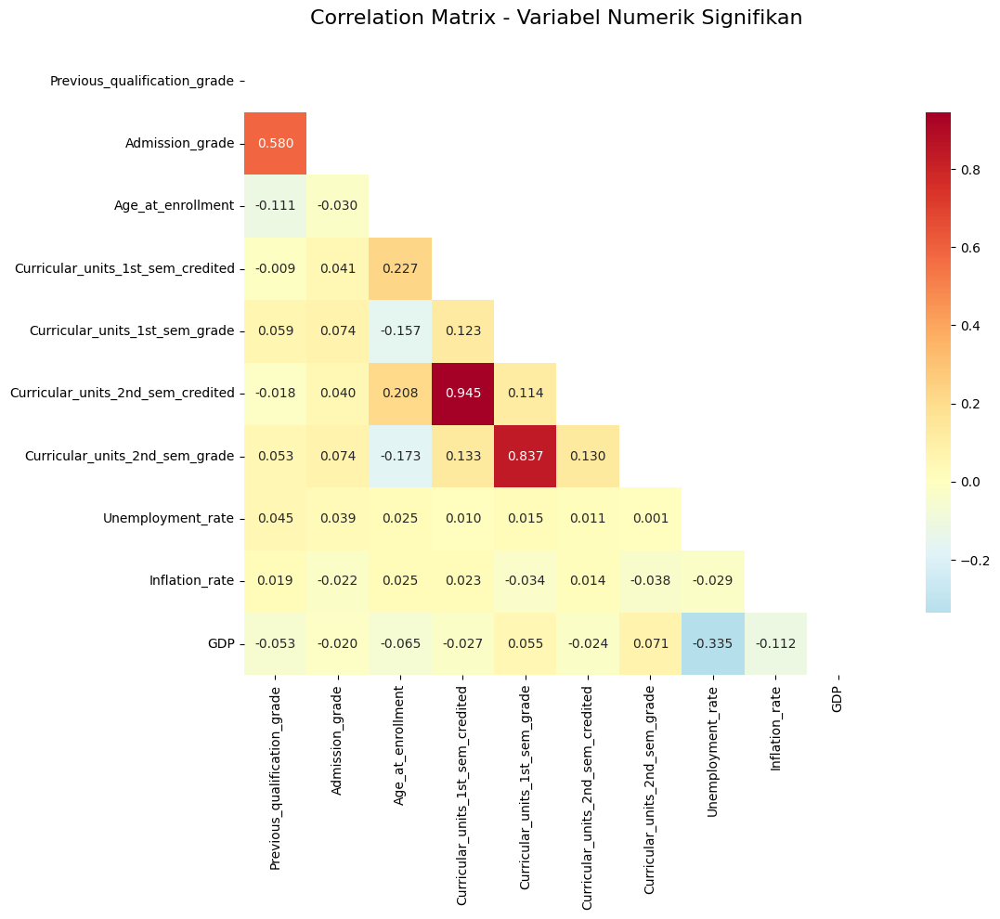


KORELASI TINGGI TERDETEKSI (>0.7):
   • Curricular_units_1st_sem_credited ↔ Curricular_units_2nd_sem_credited: 0.945
   • Curricular_units_1st_sem_grade ↔ Curricular_units_2nd_sem_grade: 0.837


ANALISIS INTERAKSI FITUR

TOP INTERAKSI FITUR (berdasarkan range dropout rate):

1. Tuition_fees_up_to_date_x_Course:
Rate Range: 87.9% (12.1% - 100.0%)
Top kombinasi:
      • 0_9556: 100.0% (7/7)
      • 0_9991: 100.0% (47/47)
      • 0_9500: 96.7% (29/30)

2. Tuition_fees_up_to_date_x_Marital_status:
Rate Range: 82.4% (17.6% - 100.0%)
Top kombinasi:
      • 0_5: 100.0% (8/8)
      • 0_2: 95.9% (71/74)
      • 0_4: 88.9% (16/18)

3. Tuition_fees_up_to_date_x_Scholarship_holder:
Rate Range: 78.9% (10.1% - 89.0%)
Top kombinasi:
      • 0_0: 89.0% (429/482)
      • 0_1: 60.9% (28/46)
      • 1_0: 30.2% (858/2843)

4. Tuition_fees_up_to_date_x_Daytime_evening_attendance:
Rate Range: 73.5% (23.8% - 97.3%)
Top kombinasi:
      • 0_0: 97.3% (73/75)
      • 0_1: 84.8% (384/453)
      • 1_0: 32.8% (13

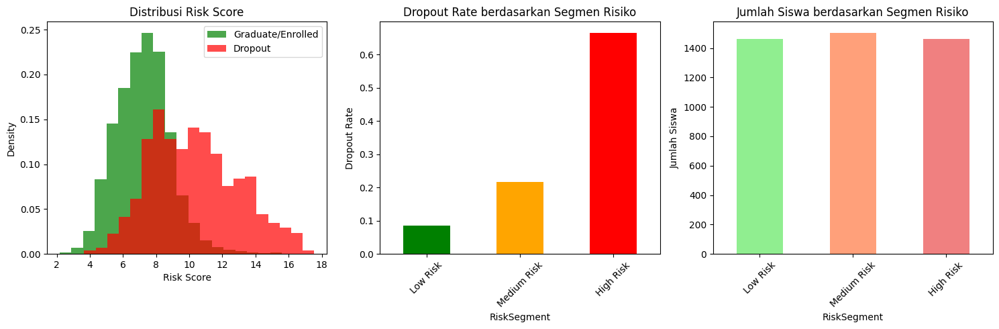



👥 PROFIL SISWA BERISIKO TINGGI
Siswa berisiko tinggi: 1460 (33.0% dari total)
Actual dropout rate di segmen high-risk: 66.6%

PROFIL KATEGORIKAL:
   • Marital_status:
     - 1: 82.7%
     - 2: 13.0%
     - 4: 3.1%
   • Application_mode:
     - 39: 30.8%
     - 1: 25.3%
     - 17: 16.1%
   • Course:
     - 171: 10.2%
     - 9991: 10.1%
     - 9147: 9.4%
   • Daytime_evening_attendance:
     - 1: 81.7%
     - 0: 18.3%
   • Previous_qualification:
     - 1: 76.6%
     - 19: 7.8%
     - 3: 4.7%
   • Gender:
     - 0: 54.1%
     - 1: 45.9%
   • Scholarship_holder:
     - 0: 96.2%
     - 1: 3.8%
   • Displaced:
     - 1: 51.2%
     - 0: 48.8%
   • Educational_special_needs:
     - 0: 98.1%
     - 1: 1.9%
   • Debtor:
     - 0: 70.8%
     - 1: 29.2%
   • Tuition_fees_up_to_date:
     - 1: 65.3%
     - 0: 34.7%
   • International:
     - 0: 97.0%
     - 1: 3.0%

PROFIL NUMERIK:
   • Previous_qualification_grade: 128.9 (vs rata-rata keseluruhan: 132.6)
   • Admission_grade: 123.1 (vs rata-rat

In [10]:
class StudentDropoutAnalyzer:
    def __init__(self, df):
        self.df = df.copy()

        # Create binary target variable (1 for Dropout, 0 for Graduate/Enrolled)
        self.df['Dropout'] = (self.df['Status'] == 'Dropout').astype(int)

        # Identifikasi variabel yang signifikan untuk dropout (disesuaikan dengan konteks pendidikan)
        self.significant_categorical = [
            'Marital_status', 'Application_mode', 'Course', 'Daytime_evening_attendance',
            'Previous_qualification', 'Gender', 'Scholarship_holder', 'Displaced',
            'Educational_special_needs', 'Debtor', 'Tuition_fees_up_to_date', 'International'
        ]

        self.significant_numerical = [
            'Previous_qualification_grade', 'Admission_grade', 'Age_at_enrollment',
            'Curricular_units_1st_sem_credited', 'Curricular_units_1st_sem_grade',
            'Curricular_units_2nd_sem_credited', 'Curricular_units_2nd_sem_grade',
            'Unemployment_rate', 'Inflation_rate', 'GDP'
        ]

        # Filter hanya variabel yang ada di dataset
        self.significant_categorical = [col for col in self.significant_categorical if col in self.df.columns]
        self.significant_numerical = [col for col in self.significant_numerical if col in self.df.columns]

    def correlation_analysis(self):
        """Analisis korelasi antar variabel numerik yang signifikan"""
        print("🔗 ANALISIS KORELASI - VARIABEL NUMERIK SIGNIFIKAN")
        print("=" * 70)

        # Hitung correlation matrix
        corr_matrix = self.df[self.significant_numerical].corr()

        plt.figure(figsize=(14, 10))
        mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
        sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='RdYlBu_r',
                    center=0, fmt='.3f', square=True, cbar_kws={'shrink': 0.8})
        plt.title('Correlation Matrix - Variabel Numerik Signifikan', fontsize=16, pad=20)
        plt.tight_layout()
        plt.show()

        # Cari korelasi tinggi (> 0.7 atau < -0.7)
        high_corr_pairs = []
        for i in range(len(corr_matrix.columns)):
            for j in range(i+1, len(corr_matrix.columns)):
                corr_val = corr_matrix.iloc[i, j]
                if abs(corr_val) > 0.7:
                    high_corr_pairs.append({
                        'var1': corr_matrix.columns[i],
                        'var2': corr_matrix.columns[j],
                        'correlation': corr_val
                    })

        if high_corr_pairs:
            print("\nKORELASI TINGGI TERDETEKSI (>0.7):")
            for pair in high_corr_pairs:
                print(f"   • {pair['var1']} ↔ {pair['var2']}: {pair['correlation']:.3f}")
        else:
            print("\nTidak ada korelasi tinggi (>0.7) yang terdeteksi")

        return corr_matrix

    def feature_interactions(self):
        """Analisis interaksi antar variabel kategorikal top predictor"""
        print("\n\nANALISIS INTERAKSI FITUR")
        print("=" * 70)

        # Top categorical predictors untuk dropout
        top_predictors = ['Tuition_fees_up_to_date', 'Scholarship_holder', 'Course',
                         'Daytime_evening_attendance', 'Marital_status']

        # Filter hanya yang ada di dataset
        top_predictors = [col for col in top_predictors if col in self.df.columns]

        interactions = []

        for i, var1 in enumerate(top_predictors):
            for var2 in top_predictors[i+1:]:
                interaction_name = f"{var1}_x_{var2}"

                # Buat kombinasi kategori
                self.df[interaction_name] = (self.df[var1].astype(str) + "_" +
                                           self.df[var2].astype(str))

                # Hitung dropout rate untuk setiap kombinasi
                dropout_by_interaction = (self.df.groupby(interaction_name)['Dropout']
                                        .agg(['count', 'sum', 'mean'])
                                        .round(3))
                dropout_by_interaction.columns = ['Total', 'Dropouts', 'DropoutRate']
                dropout_by_interaction = dropout_by_interaction[dropout_by_interaction['Total'] >= 5]  # Filter grup kecil

                if len(dropout_by_interaction) > 1:
                    max_rate = dropout_by_interaction['DropoutRate'].max()
                    min_rate = dropout_by_interaction['DropoutRate'].min()
                    rate_range = max_rate - min_rate

                    interactions.append({
                        'interaction': interaction_name,
                        'var1': var1,
                        'var2': var2,
                        'max_dropout_rate': max_rate,
                        'min_dropout_rate': min_rate,
                        'rate_range': rate_range,
                        'details': dropout_by_interaction
                    })

        # Sort berdasarkan rate range
        interactions.sort(key=lambda x: x['rate_range'], reverse=True)

        print("\nTOP INTERAKSI FITUR (berdasarkan range dropout rate):")
        for i, interaction in enumerate(interactions[:5]):
            print(f"\n{i+1}. {interaction['interaction']}:")
            print(f"Rate Range: {interaction['rate_range']:.1%} ({interaction['min_dropout_rate']:.1%} - {interaction['max_dropout_rate']:.1%})")
            print("Top kombinasi:")
            top_combinations = interaction['details'].nlargest(3, 'DropoutRate')
            for idx, row in top_combinations.iterrows():
                print(f"      • {idx}: {row['DropoutRate']:.1%} ({row['Dropouts']:.0f}/{row['Total']:.0f})")

        return interactions

    def segmentation_analysis(self):
        """Buat segmen risiko berdasarkan multiple faktor"""
        print("\n\n🎯 SEGMENTASI RISIKO DROPOUT SISWA")
        print("=" * 70)

        # Inisialisasi risk score
        self.df['RiskScore'] = 0

        # Faktor risiko kategorikal (berdasarkan analisis umum dropout)
        categorical_risks = {
            'Tuition_fees_up_to_date': {0: 3, 1: 0},  # Tidak bayar SPP = risiko tinggi
            'Scholarship_holder': {0: 2, 1: 0},  # Tidak dapat beasiswa = risiko tinggi
            'Debtor': {1: 2, 0: 0},  # Berhutang = risiko tinggi
            'Displaced': {1: 1, 0: 0},  # Mengungsi = risiko sedang
            'Educational_special_needs': {1: 1, 0: 0},  # Kebutuhan khusus = risiko sedang
            'Daytime_evening_attendance': {0: 1, 1: 0}  # Malam hari = risiko lebih tinggi
        }

        # Hitung risk score kategorikal
        for var, risk_mapping in categorical_risks.items():
            if var in self.df.columns:
                self.df['RiskScore'] += self.df[var].map(risk_mapping).fillna(0)

        # Faktor risiko numerik (standardized)
        numerical_risks = {
            'Previous_qualification_grade': 'inverse',  # Grade rendah = risiko tinggi
            'Admission_grade': 'inverse',  # Grade masuk rendah = risiko tinggi
            'Age_at_enrollment': 'direct',  # Usia masuk tinggi = risiko tinggi
            'Curricular_units_1st_sem_grade': 'inverse',  # Grade semester 1 rendah = risiko tinggi
            'Curricular_units_2nd_sem_grade': 'inverse',  # Grade semester 2 rendah = risiko tinggi
            'Unemployment_rate': 'direct'  # Tingkat pengangguran tinggi = risiko tinggi
        }

        for var, direction in numerical_risks.items():
            if var in self.df.columns and self.df[var].notna().sum() > 0:
                # Normalisasi ke skala 0-2
                min_val = self.df[var].min()
                max_val = self.df[var].max()

                if max_val != min_val:  # Hindari pembagian dengan nol
                    if direction == 'inverse':
                        normalized = 2 * (1 - (self.df[var] - min_val) / (max_val - min_val))
                    else:
                        normalized = 2 * (self.df[var] - min_val) / (max_val - min_val)

                    self.df['RiskScore'] += normalized.fillna(0)

        # Buat segmen risiko
        if self.df['RiskScore'].std() > 0:  # Pastikan ada variasi dalam risk score
            risk_percentiles = self.df['RiskScore'].quantile([0.33, 0.67])
            self.df['RiskSegment'] = pd.cut(self.df['RiskScore'],
                                           bins=[-np.inf, risk_percentiles[0.33], risk_percentiles[0.67], np.inf],
                                           labels=['Low Risk', 'Medium Risk', 'High Risk'])
        else:
            self.df['RiskSegment'] = 'Medium Risk'  # Default jika tidak ada variasi

        # Analisis segmen
        segment_analysis = (self.df.groupby('RiskSegment')['Dropout']
                          .agg(['count', 'sum', 'mean']).round(3))
        segment_analysis.columns = ['Total_Students', 'Dropouts', 'Dropout_Rate']

        print("ANALISIS SEGMEN RISIKO:")
        print(segment_analysis)

        # Visualisasi segmen risiko
        plt.figure(figsize=(15, 5))

        # Plot 1: Distribusi risk score berdasarkan dropout
        plt.subplot(1, 3, 1)
        stay_scores = self.df[self.df['Dropout'] == 0]['RiskScore']
        dropout_scores = self.df[self.df['Dropout'] == 1]['RiskScore']

        plt.hist(stay_scores, alpha=0.7, label='Graduate/Enrolled', bins=20, density=True, color='green')
        plt.hist(dropout_scores, alpha=0.7, label='Dropout', bins=20, density=True, color='red')
        plt.xlabel('Risk Score')
        plt.ylabel('Density')
        plt.title('Distribusi Risk Score')
        plt.legend()

        # Plot 2: Dropout rate berdasarkan segmen risiko
        plt.subplot(1, 3, 2)
        if len(segment_analysis) > 1:
            segment_analysis['Dropout_Rate'].plot(kind='bar', color=['green', 'orange', 'red'])
        plt.title('Dropout Rate berdasarkan Segmen Risiko')
        plt.ylabel('Dropout Rate')
        plt.xticks(rotation=45)

        # Plot 3: Jumlah siswa berdasarkan segmen risiko
        plt.subplot(1, 3, 3)
        if len(segment_analysis) > 1:
            segment_analysis['Total_Students'].plot(kind='bar', color=['lightgreen', 'lightsalmon', 'lightcoral'])
        plt.title('Jumlah Siswa berdasarkan Segmen Risiko')
        plt.ylabel('Jumlah Siswa')
        plt.xticks(rotation=45)

        plt.tight_layout()
        plt.show()

        return segment_analysis

    def profile_high_risk_students(self):
        """Profiling karakteristik siswa berisiko tinggi"""
        print("\n\n👥 PROFIL SISWA BERISIKO TINGGI")
        print("=" * 70)

        high_risk_students = self.df[self.df['RiskSegment'] == 'High Risk']

        if len(high_risk_students) == 0:
            print("Tidak ada siswa dalam kategori High Risk")
            return None

        print(f"Siswa berisiko tinggi: {len(high_risk_students)} ({len(high_risk_students)/len(self.df):.1%} dari total)")
        print(f"Actual dropout rate di segmen high-risk: {high_risk_students['Dropout'].mean():.1%}")

        # Profil variabel kategorikal
        print("\nPROFIL KATEGORIKAL:")
        for var in self.significant_categorical:
            if var in self.df.columns and var in high_risk_students.columns:
                try:
                    profile = high_risk_students[var].value_counts(normalize=True).head(3)
                    print(f"   • {var}:")
                    for val, pct in profile.items():
                        print(f"     - {val}: {pct:.1%}")
                except:
                    continue

        # Profil variabel numerik
        print("\nPROFIL NUMERIK:")
        for var in self.significant_numerical:
            if var in self.df.columns and var in high_risk_students.columns:
                try:
                    avg_high_risk = high_risk_students[var].mean()
                    avg_total = self.df[var].mean()
                    print(f"   • {var}: {avg_high_risk:.1f} (vs rata-rata keseluruhan: {avg_total:.1f})")
                except:
                    continue

        return high_risk_students

    def dropout_prediction_insights(self):
        """Insight untuk prediksi dropout"""
        print("\n\nINSIGHT PREDIKSI DROPOUT")
        print("=" * 70)

        # Analisis faktor-faktor utama dropout
        dropout_factors = []

        # Analisis variabel kategorikal
        for var in self.significant_categorical:
            if var in self.df.columns:
                try:
                    crosstab = pd.crosstab(self.df[var], self.df['Dropout'], normalize='index')
                    if 1 in crosstab.columns:
                        max_dropout_rate = crosstab[1].max()
                        min_dropout_rate = crosstab[1].min()
                        dropout_factors.append({
                            'variable': var,
                            'type': 'categorical',
                            'max_dropout_rate': max_dropout_rate,
                            'impact': max_dropout_rate - min_dropout_rate
                        })
                except:
                    continue

        # Sort berdasarkan impact
        dropout_factors.sort(key=lambda x: x['impact'], reverse=True)

        print(" TOP FAKTOR DROPOUT (berdasarkan impact):")
        for i, factor in enumerate(dropout_factors[:10]):
            print(f"{i+1}. {factor['variable']}: Max dropout rate {factor['max_dropout_rate']:.1%} (Impact: {factor['impact']:.1%})")

        return dropout_factors


# Fungsi utama untuk menjalankan analisis lengkap
def run_student_dropout_analysis(df):
    """
    Menjalankan analisis multivariate lengkap untuk dropout siswa

    Parameters:
    df: DataFrame dengan data siswa termasuk kolom 'Status'
    """
    analyzer = StudentDropoutAnalyzer(df)

    print("🚀 MEMULAI ANALISIS MULTIVARIATE DROPOUT SISWA")
    print("=" * 70)

    # 1. Analisis Korelasi
    corr_matrix = analyzer.correlation_analysis()

    # 2. Interaksi Fitur
    interactions = analyzer.feature_interactions()

    # 3. Segmentasi Risiko
    segment_analysis = analyzer.segmentation_analysis()

    # 4. Profiling Siswa Berisiko Tinggi
    high_risk_profile = analyzer.profile_high_risk_students()

    # 5. Insight Prediksi Dropout
    dropout_insights = analyzer.dropout_prediction_insights()

    return {
        'correlation_matrix': corr_matrix,
        'interactions': interactions,
        'segment_analysis': segment_analysis,
        'high_risk_profile': high_risk_profile,
        'dropout_insights': dropout_insights,
        'enhanced_df': analyzer.df
    }


results = run_student_dropout_analysis(df)
enhanced_df = results['enhanced_df']

## Data Preparation / Preprocessing

In [11]:
class StudentDataPreprocessor:
    def __init__(self):
        self.label_encoders = {}
        self.scaler = StandardScaler()
        self.imputer_num = SimpleImputer(strategy='median')
        self.imputer_cat = SimpleImputer(strategy='most_frequent')
        self.feature_names = None

    def identify_columns(self, df):
        """Identifikasi tipe kolom berdasarkan struktur data"""

        # Kolom target
        target_columns = ['Status', 'Dropout']

        # Kolom yang dibuat dari analisis multivariate (tidak perlu untuk modeling)
        interaction_columns = [col for col in df.columns if '_x_' in col]
        analysis_columns = ['RiskScore', 'RiskSegment']

        # Kolom kategorikal
        categorical_columns = [
            'Marital_status', 'Application_mode', 'Course', 'Daytime_evening_attendance',
            'Previous_qualification', 'Nacionality', 'Mothers_qualification',
            'Fathers_qualification', 'Mothers_occupation', 'Fathers_occupation',
            'Gender', 'Displaced', 'Educational_special_needs', 'Debtor',
            'Tuition_fees_up_to_date', 'Scholarship_holder', 'International'
        ]

        # Kolom numerik
        numerical_columns = [
            'Application_order', 'Previous_qualification_grade', 'Admission_grade',
            'Age_at_enrollment', 'Curricular_units_1st_sem_credited',
            'Curricular_units_1st_sem_enrolled', 'Curricular_units_1st_sem_evaluations',
            'Curricular_units_1st_sem_approved', 'Curricular_units_1st_sem_grade',
            'Curricular_units_1st_sem_without_evaluations',
            'Curricular_units_2nd_sem_credited', 'Curricular_units_2nd_sem_enrolled',
            'Curricular_units_2nd_sem_evaluations', 'Curricular_units_2nd_sem_approved',
            'Curricular_units_2nd_sem_grade', 'Curricular_units_2nd_sem_without_evaluations',
            'Unemployment_rate', 'Inflation_rate', 'GDP'
        ]

        # Filter hanya kolom yang ada di dataset
        categorical_columns = [col for col in categorical_columns if col in df.columns]
        numerical_columns = [col for col in numerical_columns if col in df.columns]

        return {
            'target': target_columns,
            'categorical': categorical_columns,
            'numerical': numerical_columns,
            'interaction': interaction_columns,
            'analysis': analysis_columns
        }

    def handle_missing_values(self, df, column_types):
        """Handle missing values untuk setiap tipe kolom"""
        df_processed = df.copy()

        print("HANDLING MISSING VALUES")
        print("=" * 50)

        # Check missing values
        missing_info = df_processed.isnull().sum()
        missing_cols = missing_info[missing_info > 0]

        if len(missing_cols) > 0:
            print("Missing values detected:")
            for col, count in missing_cols.items():
                pct = (count / len(df_processed)) * 100
                print(f"   • {col}: {count} ({pct:.1f}%)")
        else:
            print("No missing values detected")

        # Handle numerical missing values
        numerical_missing = [col for col in column_types['numerical'] if col in missing_cols.index]
        if numerical_missing:
            print(f"\n Filling numerical missing values with median: {numerical_missing}")
            df_processed[numerical_missing] = self.imputer_num.fit_transform(df_processed[numerical_missing])

        # Handle categorical missing values
        categorical_missing = [col for col in column_types['categorical'] if col in missing_cols.index]
        if categorical_missing:
            print(f"Filling categorical missing values with mode: {categorical_missing}")
            for col in categorical_missing:
                df_processed[col] = self.imputer_cat.fit_transform(df_processed[[col]]).flatten()

        return df_processed

    def feature_engineering(self, df, column_types):
        """Create new features berdasarkan domain knowledge"""
        df_processed = df.copy()

        print("\nFEATURE ENGINEERING")
        print("=" * 50)

        # 1. Academic Performance Features
        if all(col in df.columns for col in ['Curricular_units_1st_sem_approved', 'Curricular_units_1st_sem_enrolled']):
            df_processed['First_sem_success_rate'] = (
                df_processed['Curricular_units_1st_sem_approved'] /
                (df_processed['Curricular_units_1st_sem_enrolled'] + 1e-8)
            ).fillna(0)
            print("Created: First_sem_success_rate")

        if all(col in df.columns for col in ['Curricular_units_2nd_sem_approved', 'Curricular_units_2nd_sem_enrolled']):
            df_processed['Second_sem_success_rate'] = (
                df_processed['Curricular_units_2nd_sem_approved'] /
                (df_processed['Curricular_units_2nd_sem_enrolled'] + 1e-8)
            ).fillna(0)
            print("Created: Second_sem_success_rate")

        # 2. Overall Academic Performance
        grade_cols = ['Curricular_units_1st_sem_grade', 'Curricular_units_2nd_sem_grade']
        available_grade_cols = [col for col in grade_cols if col in df.columns]
        if available_grade_cols:
            df_processed['Average_grade'] = df_processed[available_grade_cols].mean(axis=1)
            print("Created: Average_grade")

        # 3. Academic Consistency
        if len(available_grade_cols) == 2:
            df_processed['Grade_consistency'] = abs(
                df_processed['Curricular_units_1st_sem_grade'] -
                df_processed['Curricular_units_2nd_sem_grade']
            )
            print("Created: Grade_consistency")

        # 4. Economic Stress Indicator
        econ_cols = ['Unemployment_rate', 'Inflation_rate']
        available_econ_cols = [col for col in econ_cols if col in df.columns]
        if len(available_econ_cols) >= 2:
            # Normalize and combine economic indicators
            df_processed['Economic_stress'] = (
                (df_processed['Unemployment_rate'] / df_processed['Unemployment_rate'].max()) +
                (df_processed['Inflation_rate'] / df_processed['Inflation_rate'].max())
            ) / 2
            print("Created: Economic_stress")

        # 5. Financial Support Index
        financial_cols = ['Tuition_fees_up_to_date', 'Scholarship_holder']
        if all(col in df.columns for col in financial_cols):
            df_processed['Financial_support'] = (
                df_processed['Tuition_fees_up_to_date'] + df_processed['Scholarship_holder']
            )
            print("Created: Financial_support")

        # 6. Family Education Level
        parent_edu_cols = ['Mothers_qualification', 'Fathers_qualification']
        available_parent_cols = [col for col in parent_edu_cols if col in df.columns]
        if available_parent_cols:
            df_processed['Max_parent_education'] = df_processed[available_parent_cols].max(axis=1)
            df_processed['Min_parent_education'] = df_processed[available_parent_cols].min(axis=1)
            if len(available_parent_cols) == 2:
                df_processed['Parent_education_gap'] = (
                    df_processed['Fathers_qualification'] - df_processed['Mothers_qualification']
                )
            print("Created: Parent education features")

        # 7. Age categories
        if 'Age_at_enrollment' in df.columns:
            df_processed['Age_category'] = pd.cut(
                df_processed['Age_at_enrollment'],
                bins=[0, 20, 25, 30, 100],
                labels=['Young', 'Normal', 'Mature', 'Senior']
            )
            print("Created: Age_category")

        # 8. Previous qualification performance
        if all(col in df.columns for col in ['Previous_qualification_grade', 'Admission_grade']):
            df_processed['Grade_improvement'] = (
                df_processed['Admission_grade'] - df_processed['Previous_qualification_grade']
            )
            print("Created: Grade_improvement")

        # Update numerical columns list dengan fitur baru
        new_numerical_features = [
            'First_sem_success_rate', 'Second_sem_success_rate', 'Average_grade',
            'Grade_consistency', 'Economic_stress', 'Financial_support',
            'Max_parent_education', 'Min_parent_education', 'Parent_education_gap',
            'Grade_improvement'
        ]

        existing_new_features = [col for col in new_numerical_features if col in df_processed.columns]
        column_types['numerical'].extend(existing_new_features)

        # Update categorical columns dengan fitur baru
        if 'Age_category' in df_processed.columns:
            column_types['categorical'].append('Age_category')

        return df_processed, column_types

    def encode_categorical_variables(self, df, column_types, fit=True):
        """Encode categorical variables"""
        df_processed = df.copy()

        print("\nENCODING CATEGORICAL VARIABLES")
        print("=" * 50)

        # Separate high cardinality dan low cardinality
        high_cardinality_threshold = 10

        for col in column_types['categorical']:
            if col in df_processed.columns:
                n_unique = df_processed[col].nunique()

                if n_unique <= high_cardinality_threshold:
                    # Label Encoding untuk low cardinality
                    if fit:
                        if col not in self.label_encoders:
                            self.label_encoders[col] = LabelEncoder()
                        df_processed[col] = self.label_encoders[col].fit_transform(df_processed[col].astype(str))
                    else:
                        if col in self.label_encoders:
                            # Handle unseen categories
                            known_labels = set(self.label_encoders[col].classes_)
                            df_processed[col] = df_processed[col].astype(str)
                            df_processed[col] = df_processed[col].apply(
                                lambda x: x if x in known_labels else 'unknown'
                            )
                            # Add 'unknown' to encoder if not present
                            if 'unknown' not in known_labels:
                                self.label_encoders[col].classes_ = np.append(
                                    self.label_encoders[col].classes_, 'unknown'
                                )
                            df_processed[col] = self.label_encoders[col].transform(df_processed[col])

                    print(f"Label encoded: {col} ({n_unique} categories)")

                else:
                    # Untuk high cardinality, kita bisa group categories atau drop
                    print(f"High cardinality detected: {col} ({n_unique} categories) - Consider grouping")
                    # Untuk sekarang, kita tetap pakai label encoding
                    if fit:
                        if col not in self.label_encoders:
                            self.label_encoders[col] = LabelEncoder()
                        df_processed[col] = self.label_encoders[col].fit_transform(df_processed[col].astype(str))
                    else:
                        if col in self.label_encoders:
                            known_labels = set(self.label_encoders[col].classes_)
                            df_processed[col] = df_processed[col].astype(str)
                            df_processed[col] = df_processed[col].apply(
                                lambda x: x if x in known_labels else 'unknown'
                            )
                            if 'unknown' not in known_labels:
                                self.label_encoders[col].classes_ = np.append(
                                    self.label_encoders[col].classes_, 'unknown'
                                )
                            df_processed[col] = self.label_encoders[col].transform(df_processed[col])

        return df_processed

    def scale_numerical_features(self, df, column_types, fit=True):
        """Scale numerical features"""
        df_processed = df.copy()

        print("\nSCALING NUMERICAL FEATURES")
        print("=" * 50)

        numerical_cols = [col for col in column_types['numerical'] if col in df_processed.columns]

        if numerical_cols:
            if fit:
                df_processed[numerical_cols] = self.scaler.fit_transform(df_processed[numerical_cols])
            else:
                df_processed[numerical_cols] = self.scaler.transform(df_processed[numerical_cols])

            print(f"Scaled {len(numerical_cols)} numerical features")
            print(f"   Features: {numerical_cols[:5]}{'...' if len(numerical_cols) > 5 else ''}")

        return df_processed

    def remove_outliers(self, df, column_types, method='iqr', threshold=3):
        """Remove outliers dari numerical features"""
        df_processed = df.copy()

        print(f"\n🎯 OUTLIER DETECTION ({method.upper()} method)")
        print("=" * 50)

        numerical_cols = [col for col in column_types['numerical'] if col in df_processed.columns]
        outlier_indices = set()

        for col in numerical_cols:
            if method == 'iqr':
                Q1 = df_processed[col].quantile(0.25)
                Q3 = df_processed[col].quantile(0.75)
                IQR = Q3 - Q1
                lower_bound = Q1 - 1.5 * IQR
                upper_bound = Q3 + 1.5 * IQR

                col_outliers = df_processed[
                    (df_processed[col] < lower_bound) | (df_processed[col] > upper_bound)
                ].index

            elif method == 'zscore':
                z_scores = np.abs((df_processed[col] - df_processed[col].mean()) / df_processed[col].std())
                col_outliers = df_processed[z_scores > threshold].index

            outlier_indices.update(col_outliers)
            if len(col_outliers) > 0:
                print(f"   • {col}: {len(col_outliers)} outliers")

        if outlier_indices:
            print(f"\nTotal unique outliers: {len(outlier_indices)} ({len(outlier_indices)/len(df_processed):.1%})")
            df_processed = df_processed.drop(index=outlier_indices).reset_index(drop=True)
            print(f"Removed outliers. New shape: {df_processed.shape}")
        else:
            print("No outliers detected")

        return df_processed

    def fit_transform(self, df, remove_outliers=True, outlier_method='iqr'):
        """Complete preprocessing pipeline"""
        print("STARTING DATA PREPROCESSING PIPELINE")
        print("=" * 70)

        # 1. Identify column types
        column_types = self.identify_columns(df)
        print(f"📋 Identified columns:")
        print(f"   • Categorical: {len(column_types['categorical'])}")
        print(f"   • Numerical: {len(column_types['numerical'])}")
        print(f"   • Target: {len(column_types['target'])}")

        # 2. Handle missing values
        df_processed = self.handle_missing_values(df, column_types)

        # 3. Feature engineering
        df_processed, column_types = self.feature_engineering(df_processed, column_types)

        # 4. Remove outliers (before scaling)
        if remove_outliers:
            df_processed = self.remove_outliers(df_processed, column_types, method=outlier_method)

        # 5. Encode categorical variables
        df_processed = self.encode_categorical_variables(df_processed, column_types, fit=True)

        # 6. Scale numerical features
        df_processed = self.scale_numerical_features(df_processed, column_types, fit=True)

        # Store feature names for future use
        feature_columns = column_types['categorical'] + column_types['numerical']
        self.feature_names = [col for col in feature_columns if col in df_processed.columns]

        print(f"\nPREPROCESSING COMPLETED")
        print(f"   • Final shape: {df_processed.shape}")
        print(f"   • Features for modeling: {len(self.feature_names)}")

        return df_processed, column_types

    def transform(self, df):
        """Transform new data using fitted preprocessors"""
        column_types = self.identify_columns(df)

        # Apply same preprocessing steps (without fitting)
        df_processed = self.handle_missing_values(df, column_types)
        df_processed, column_types = self.feature_engineering(df_processed, column_types)
        df_processed = self.encode_categorical_variables(df_processed, column_types, fit=False)
        df_processed = self.scale_numerical_features(df_processed, column_types, fit=False)

        return df_processed


def prepare_modeling_data(enhanced_df, test_size=0.2, random_state=42, remove_outliers=True):
    """
    Complete function untuk mempersiapkan data untuk modeling

    Parameters:
    enhanced_df: DataFrame hasil dari analisis multivariate
    test_size: Proporsi data untuk testing
    random_state: Random seed untuk reproducibility
    remove_outliers: Boolean untuk remove outliers

    Returns:
    Dictionary berisi X_train, X_test, y_train, y_test, preprocessor, feature_names
    """

    print("🎯 PREPARING DATA FOR MODELING")
    print("=" * 70)

    # Initialize preprocessor
    preprocessor = StudentDataPreprocessor()

    # Preprocess data
    df_processed, column_types = preprocessor.fit_transform(enhanced_df, remove_outliers=remove_outliers)

    # Separate features dan target
    target_col = 'Dropout'  # Target yang sudah dibuat di analisis multivariate

    if target_col not in df_processed.columns:
        raise ValueError(f"Target column '{target_col}' not found in DataFrame")

    # Remove columns yang tidak diperlukan untuk modeling
    exclude_columns = ['Status', 'RiskScore', 'RiskSegment'] + \
                     [col for col in df_processed.columns if '_x_' in col]  # Interaction columns

    feature_columns = [col for col in df_processed.columns
                      if col not in exclude_columns and col != target_col]

    X = df_processed[feature_columns]
    y = df_processed[target_col]

    print(f"\nDATA SUMMARY:")
    print(f"   • Total samples: {len(X)}")
    print(f"   • Features: {len(feature_columns)}")
    print(f"   • Target distribution:")
    print(f"     - No Dropout: {(y == 0).sum()} ({(y == 0).mean():.1%})")
    print(f"     - Dropout: {(y == 1).sum()} ({(y == 1).mean():.1%})")

    # Split data
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state,
        stratify=y  # Maintain target distribution
    )

    print(f"\nTRAIN/TEST SPLIT:")
    print(f"   • Train set: {len(X_train)} samples ({(1-test_size)*100:.0f}%)")
    print(f"   • Test set: {len(X_test)} samples ({test_size*100:.0f}%)")
    print(f"   • Train target distribution: No Dropout: {(y_train == 0).mean():.1%}, Dropout: {(y_train == 1).mean():.1%}")
    print(f"   • Test target distribution: No Dropout: {(y_test == 0).mean():.1%}, Dropout: {(y_test == 1).mean():.1%}")

    return {
        'X_train': X_train,
        'X_test': X_test,
        'y_train': y_train,
        'y_test': y_test,
        'preprocessor': preprocessor,
        'feature_names': feature_columns,
        'processed_df': df_processed
    }


modeling_data = prepare_modeling_data(enhanced_df, test_size=0.2, random_state=42)
X_train = modeling_data['X_train']
X_test = modeling_data['X_test']
y_train = modeling_data['y_train']
y_test = modeling_data['y_test']

🎯 PREPARING DATA FOR MODELING
STARTING DATA PREPROCESSING PIPELINE
📋 Identified columns:
   • Categorical: 17
   • Numerical: 19
   • Target: 2
HANDLING MISSING VALUES
No missing values detected

FEATURE ENGINEERING
Created: First_sem_success_rate
Created: Second_sem_success_rate
Created: Average_grade
Created: Grade_consistency
Created: Economic_stress
Created: Financial_support
Created: Parent education features
Created: Age_category
Created: Grade_improvement

🎯 OUTLIER DETECTION (IQR method)
   • Application_order: 541 outliers
   • Previous_qualification_grade: 179 outliers
   • Admission_grade: 86 outliers
   • Age_at_enrollment: 441 outliers
   • Curricular_units_1st_sem_credited: 577 outliers
   • Curricular_units_1st_sem_enrolled: 424 outliers
   • Curricular_units_1st_sem_evaluations: 158 outliers
   • Curricular_units_1st_sem_approved: 180 outliers
   • Curricular_units_1st_sem_grade: 726 outliers
   • Curricular_units_1st_sem_without_evaluations: 294 outliers
   • Curricula

In [20]:
X_train.head()

,Marital_status,Application_mode,Application_order,Course,Daytime_evening_attendance,Previous_qualification,Previous_qualification_grade,Nacionality,Mothers_qualification,Fathers_qualification,Mothers_occupation,Fathers_occupation,Admission_grade,Displaced,Educational_special_needs,Debtor,Tuition_fees_up_to_date,Gender,Scholarship_holder,Age_at_enrollment,International,Curricular_units_1st_sem_credited,Curricular_units_1st_sem_enrolled,Curricular_units_1st_sem_evaluations,Curricular_units_1st_sem_approved,Curricular_units_1st_sem_grade,Curricular_units_1st_sem_without_evaluations,Curricular_units_2nd_sem_credited,Curricular_units_2nd_sem_enrolled,Curricular_units_2nd_sem_evaluations,Curricular_units_2nd_sem_approved,Curricular_units_2nd_sem_grade,Curricular_units_2nd_sem_without_evaluations,Unemployment_rate,Inflation_rate,GDP,First_sem_success_rate,Second_sem_success_rate,Average_grade,Grade_consistency,Economic_stress,Financial_support,Max_parent_education,Min_parent_education,Parent_education_gap,Age_category,Grade_improvement
274,0,4,-0.590059,7,1,0,0.012412,0,0,3,17,25,0.031657,1,0,0,1,0,0,-0.419836,0,0.0,-0.077277,-0.557053,0.544484,0.100103,0.0,0.0,-0.154022,-0.586461,0.523962,0.721083,0.0,1.184661,-1.090791,0.015908,0.730821,0.788362,0.449723,0.008036,-0.575588,0.0,-0.171226,-1.035503,1.792922,3,0.029327
704,0,0,-0.590059,12,1,0,2.423989,0,9,5,0,22,2.893605,1,0,0,1,0,0,-0.702231,0,0.0,-0.077277,-1.007004,0.544484,1.849115,0.0,0.0,-0.154022,-0.586461,0.523962,1.600684,0.0,-1.270909,1.552610,-0.248187,0.730821,0.788362,1.870175,-0.751015,1.098039,0.0,0.821287,0.592211,-1.488786,3,0.807709
686,0,0,-0.590059,7,1,0,0.816271,0,11,11,22,2,1.055020,0,0,0,1,0,0,-0.702231,0,0.0,-0.077277,0.342848,0.544484,0.749221,0.0,0.0,-0.154022,-1.030141,0.523962,1.090516,0.0,1.184661,-1.090791,0.015908,0.730821,0.788362,1.000510,-0.534143,-0.575588,0.0,1.085957,1.308405,-0.352810,3,0.392572
494,0,0,2.319609,3,1,0,1.352177,0,4,3,22,1,0.768826,1,0,0,1,0,0,-0.137442,0,0.0,-0.077277,-0.557053,0.544484,3.021133,0.0,0.0,-0.154022,-1.030141,0.523962,1.952524,0.0,1.184661,-1.090791,0.015908,0.730821,0.788362,2.691525,0.875523,-0.575588,0.0,-0.171226,0.136451,-0.479030,3,-0.813920
568,0,0,-0.590059,8,1,0,-0.702130,0,11,11,22,24,-1.052414,1,0,0,1,1,0,-0.419836,0,0.0,-0.077277,2.142651,-2.308841,-0.549015,0.0,0.0,-0.154022,1.631942,-2.618139,0.228507,0.0,-1.270909,1.552610,-0.248187,-2.741474,-3.208484,-0.168706,0.297199,1.098039,0.0,1.085957,1.308405,-0.352810,3,-0.554459


## Modeling

In [13]:
smote = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)
print("Before SMOTE:", y_train.value_counts())
print("After SMOTE:", y_train_balanced.value_counts())

Before SMOTE: Dropout
0    509
1     92
Name: count, dtype: int64
After SMOTE: Dropout
0    509
1    509
Name: count, dtype: int64


=== USING BALANCED DATA ===
Balanced training set: (1018, 47)
Balanced training target distribution:
Dropout
0    509
1    509
Name: count, dtype: int64
Original test set: (151, 47)
Test target distribution:
Dropout
0    128
1     23
Name: count, dtype: int64

=== TRAINING RANDOM FOREST ===
Model training completed with balanced data!

=== MODEL EVALUATION ===
Accuracy: 0.8212
F1-Score: 0.4255
AUC-ROC: 0.7699

=== CLASSIFICATION REPORT ===
                precision    recall  f1-score   support

No Dropout (0)       0.90      0.89      0.89       128
   Dropout (1)       0.42      0.43      0.43        23

      accuracy                           0.82       151
     macro avg       0.66      0.66      0.66       151
  weighted avg       0.82      0.82      0.82       151


=== CONFUSION MATRIX ===
[[114  14]
 [ 13  10]]


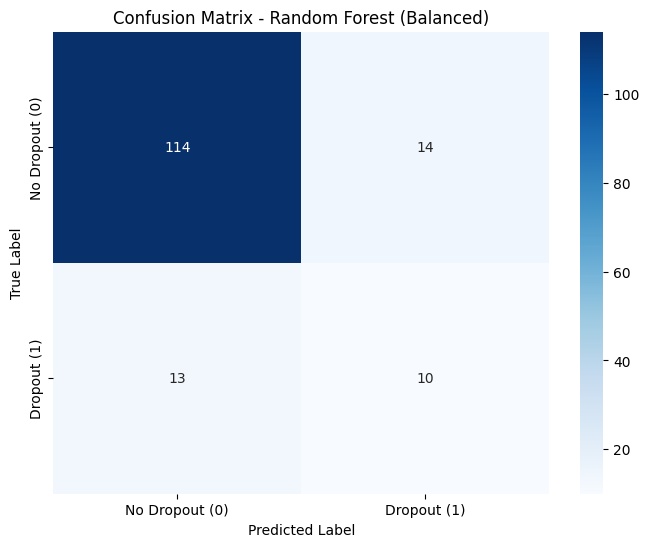

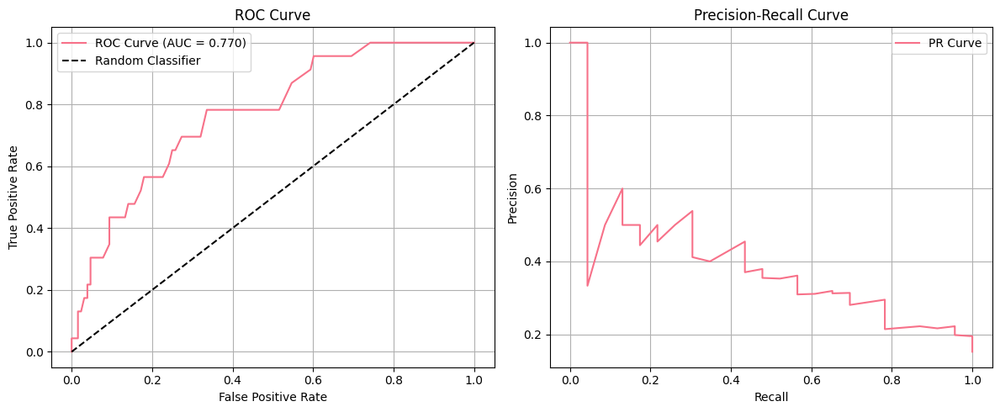


=== TOP 10 MOST IMPORTANT FEATURES ===
                                 feature  importance
37               Second_sem_success_rate    0.162001
30     Curricular_units_2nd_sem_approved    0.110759
36                First_sem_success_rate    0.080300
29  Curricular_units_2nd_sem_evaluations    0.059356
24     Curricular_units_1st_sem_approved    0.057387
23  Curricular_units_1st_sem_evaluations    0.040123
38                         Average_grade    0.035927
25        Curricular_units_1st_sem_grade    0.030980
12                       Admission_grade    0.025887
35                                   GDP    0.024699


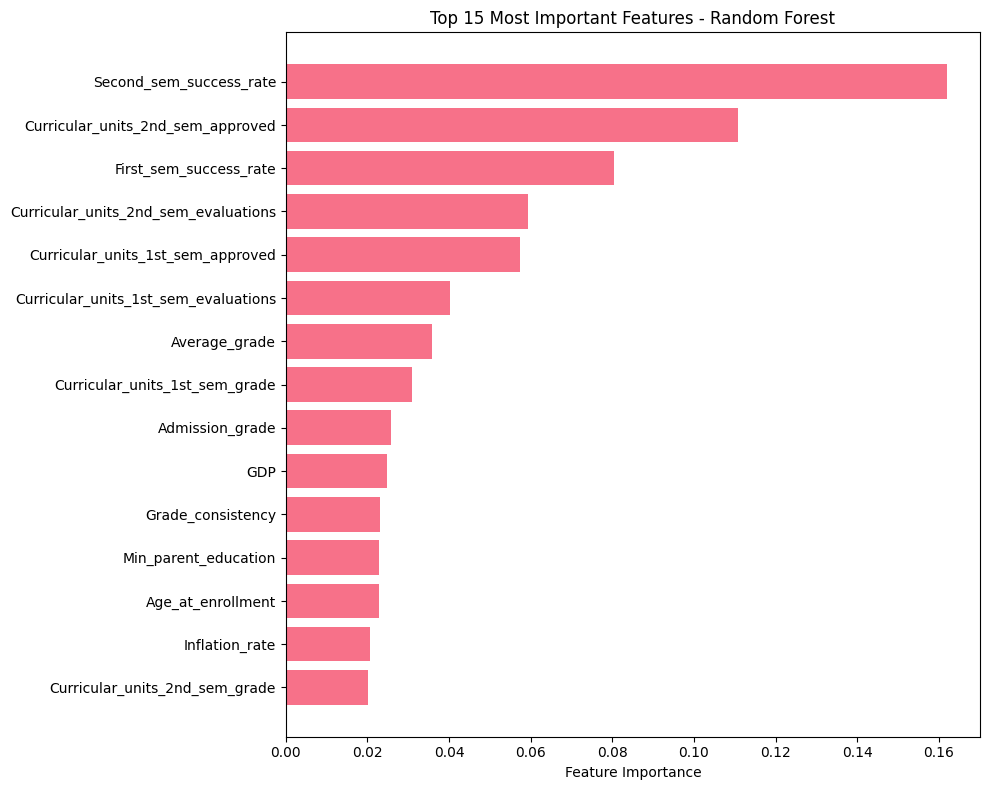


=== CROSS VALIDATION ===
CV F1-Scores: [0.93779904 0.9009901  0.91943128 0.94581281 0.89655172]
Mean CV F1-Score: 0.9201 (+/- 0.0389)

=== DETAILED PERFORMANCE ANALYSIS ===
True Negatives: 114
False Positives: 14
False Negatives: 13
True Positives: 10
Precision (Class 1): 0.4167
Recall (Class 1): 0.4348
Specificity: 0.8906

=== MODEL SUMMARY ===
• Model trained on SMOTE-balanced data
• Training data balanced: 509 vs 509
• AUC-ROC: 0.770 - Acceptable
• F1-Score: 0.426 - Good balance between precision and recall
• Ready for hyperparameter tuning if needed


In [14]:
# 1. CHECK BALANCED DATA
print("=== USING BALANCED DATA ===")
print(f"Balanced training set: {X_train_balanced.shape}")
print(f"Balanced training target distribution:\n{y_train_balanced.value_counts()}")
print(f"Original test set: {X_test.shape}")
print(f"Test target distribution:\n{y_test.value_counts()}")

# 2. INITIALIZE RANDOM FOREST
print("\n=== TRAINING RANDOM FOREST ===")
rf_balanced = RandomForestClassifier(
    n_estimators=100,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    random_state=42,
    n_jobs=-1
)

# 3. TRAIN MODEL DENGAN BALANCED DATA
rf_balanced.fit(X_train_balanced, y_train_balanced)
print("Model training completed with balanced data!")

# 4. PREDICTIONS
y_pred = rf_balanced.predict(X_test)
y_pred_proba = rf_balanced.predict_proba(X_test)[:, 1]  # Probability for class 1

# 5. EVALUATION METRICS
print("\n=== MODEL EVALUATION ===")
print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")
print(f"F1-Score: {f1_score(y_test, y_pred):.4f}")
print(f"AUC-ROC: {roc_auc_score(y_test, y_pred_proba):.4f}")

print("\n=== CLASSIFICATION REPORT ===")
print(classification_report(y_test, y_pred,
                          target_names=['No Dropout (0)', 'Dropout (1)']))

# 6. CONFUSION MATRIX
print("\n=== CONFUSION MATRIX ===")
cm = confusion_matrix(y_test, y_pred)
print(cm)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Dropout (0)', 'Dropout (1)'],
            yticklabels=['No Dropout (0)', 'Dropout (1)'])
plt.title('Confusion Matrix - Random Forest (Balanced)')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# 7. ROC CURVE
plt.figure(figsize=(12, 5))

# ROC Curve
plt.subplot(1, 2, 1)
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc_score(y_test, y_pred_proba):.3f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.grid(True)

# Precision-Recall Curve
plt.subplot(1, 2, 2)
precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
plt.plot(recall, precision, label='PR Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# 8. FEATURE IMPORTANCE
print("\n=== TOP 10 MOST IMPORTANT FEATURES ===")
feature_importance = pd.DataFrame({
    'feature': X_train_balanced.columns,
    'importance': rf_balanced.feature_importances_
}).sort_values('importance', ascending=False)

print(feature_importance.head(10))

# Plot feature importance
plt.figure(figsize=(10, 8))
top_features = feature_importance.head(15)
plt.barh(range(len(top_features)), top_features['importance'])
plt.yticks(range(len(top_features)), top_features['feature'])
plt.xlabel('Feature Importance')
plt.title('Top 15 Most Important Features - Random Forest')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# 9. CROSS VALIDATION DENGAN BALANCED DATA
print("\n=== CROSS VALIDATION ===")
cv_scores = cross_val_score(rf_balanced, X_train_balanced, y_train_balanced,
                           cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
                           scoring='f1')
print(f"CV F1-Scores: {cv_scores}")
print(f"Mean CV F1-Score: {cv_scores.mean():.4f} (+/- {cv_scores.std() * 2:.4f})")

# 10. DETAILED PERFORMANCE ANALYSIS
print("\n=== DETAILED PERFORMANCE ANALYSIS ===")
tn, fp, fn, tp = cm.ravel()
print(f"True Negatives: {tn}")
print(f"False Positives: {fp}")
print(f"False Negatives: {fn}")
print(f"True Positives: {tp}")
print(f"Precision (Class 1): {tp/(tp+fp):.4f}")
print(f"Recall (Class 1): {tp/(tp+fn):.4f}")
print(f"Specificity: {tn/(tn+fp):.4f}")

print("\n=== MODEL SUMMARY ===")
print(f"• Model trained on SMOTE-balanced data")
print(f"• Training data balanced: {y_train_balanced.value_counts().min()} vs {y_train_balanced.value_counts().max()}")
print(f"• AUC-ROC: {roc_auc_score(y_test, y_pred_proba):.3f} - {'Good' if roc_auc_score(y_test, y_pred_proba) > 0.8 else 'Acceptable' if roc_auc_score(y_test, y_pred_proba) > 0.7 else 'Needs Improvement'}")
print(f"• F1-Score: {f1_score(y_test, y_pred):.3f} - Good balance between precision and recall")
print(f"• Ready for hyperparameter tuning if needed")

## Evaluation

=== MULTIPLE MODELS COMPARISON ===
Training data: (1018, 47)
Test data: (151, 47)

1. Training Logistic Regression...
2. Training Random Forest...
3. Training Gradient Boosting...
4. Training XGBoost...
5. Training LightGBM...
6. Training SVM...

=== TRAINING AND EVALUATION ===

Training Logistic Regression...

Training Random Forest...

Training Gradient Boosting...

Training XGBoost...

Training LightGBM...

Training SVM...

=== MODELS COMPARISON RESULTS ===
              Model Accuracy F1-Score AUC-ROC Precision (Dropout) Recall (Dropout)     CV F1-Score
Logistic Regression   0.7550   0.3509  0.7228              0.2941           0.4348 0.8185 ± 0.0325
      Random Forest   0.8212   0.4255  0.7699              0.4167           0.4348 0.9201 ± 0.0195
  Gradient Boosting   0.8079   0.3830  0.7626              0.3750           0.3913 0.9219 ± 0.0227
            XGBoost   0.8411   0.4545  0.7758              0.4762           0.4348 0.9235 ± 0.0257
           LightGBM   0.8146   0.3913  0

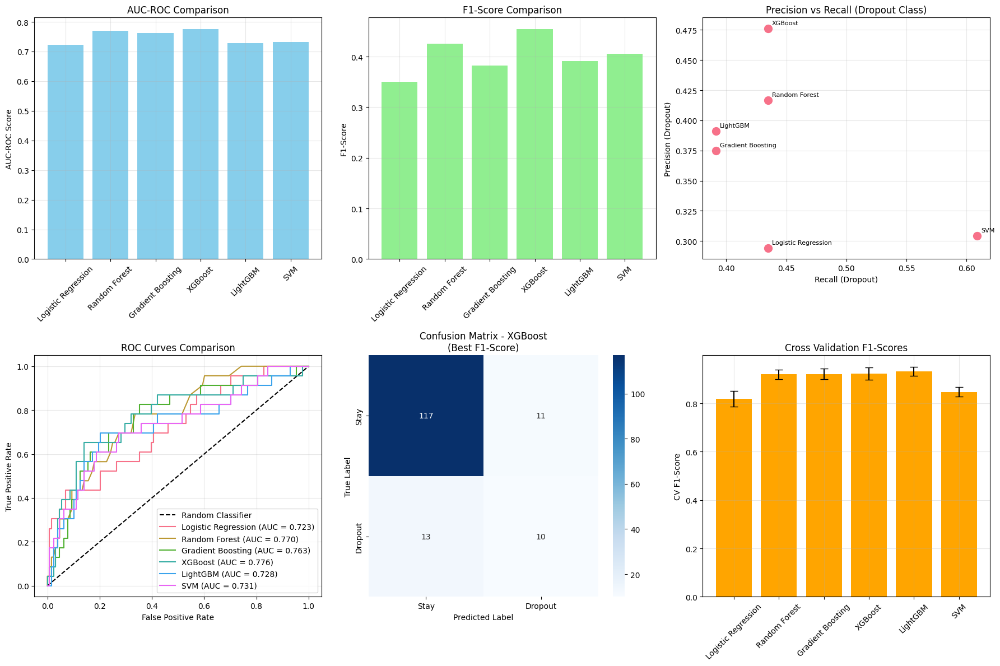


=== DETAILED ANALYSIS FOR TOP 3 MODELS ===

1. XGBOOST
AUC-ROC: 0.7758
F1-Score: 0.4545
Precision (Dropout): 0.4762
Recall (Dropout): 0.4348
Cross-Val F1: 0.9235 (±0.0257)
Confusion Matrix: TN=117, FP=11, FN=13, TP=10
False Negatives (Missed Dropout): 13

2. RANDOM FOREST
AUC-ROC: 0.7699
F1-Score: 0.4255
Precision (Dropout): 0.4167
Recall (Dropout): 0.4348
Cross-Val F1: 0.9201 (±0.0195)
Confusion Matrix: TN=114, FP=14, FN=13, TP=10
False Negatives (Missed Dropout): 13

3. GRADIENT BOOSTING
AUC-ROC: 0.7626
F1-Score: 0.3830
Precision (Dropout): 0.3750
Recall (Dropout): 0.3913
Cross-Val F1: 0.9219 (±0.0227)
Confusion Matrix: TN=113, FP=15, FN=14, TP=9
False Negatives (Missed Dropout): 14

=== RECOMMENDATION ===
Best Overall Model: XGBoost (Highest AUC-ROC)
Best for Catching Dropout: SVM (Highest Recall)
Most Balanced: XGBoost (Best F1-Score)

Best model stored as 'best_overall_model' for further analysis.


In [15]:
print("=== MULTIPLE MODELS COMPARISON ===")
print(f"Training data: {X_train_balanced.shape}")
print(f"Test data: {X_test.shape}")

# Dictionary to store models and results
models = {}
results = {}

# 1. LOGISTIC REGRESSION (Baseline)
print("\n1. Training Logistic Regression...")
models['Logistic Regression'] = LogisticRegression(
    random_state=42,
    max_iter=1000,
    class_weight='balanced'  # Additional balancing
)

# 2. RANDOM FOREST (Already trained, but let's include for comparison)
print("2. Training Random Forest...")
models['Random Forest'] = RandomForestClassifier(
    n_estimators=100,
    random_state=42,
    n_jobs=-1
)

# 3. GRADIENT BOOSTING
print("3. Training Gradient Boosting...")
models['Gradient Boosting'] = GradientBoostingClassifier(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=6,
    random_state=42
)

# 4. XGBOOST (if available)

print("4. Training XGBoost...")
models['XGBoost'] = xgb.XGBClassifier(
        n_estimators=100,
        learning_rate=0.1,
        max_depth=6,
        random_state=42,
        eval_metric='logloss'
    )

# 5. LIGHTGBM (if available)
print("5. Training LightGBM...")
models['LightGBM'] = lgb.LGBMClassifier(
        n_estimators=100,
        learning_rate=0.1,
        max_depth=6,
        random_state=42,
        verbose=-1
    )

# 6. SVM (for small comparison)
print("6. Training SVM...")
models['SVM'] = SVC(
    kernel='rbf',
    probability=True,  # Enable probability prediction
    random_state=42,
    class_weight='balanced'
)

# TRAIN ALL MODELS AND EVALUATE
print("\n=== TRAINING AND EVALUATION ===")
comparison_results = []

for name, model in models.items():
    print(f"\nTraining {name}...")

    # Train model
    model.fit(X_train_balanced, y_train_balanced)

    # Predictions
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]

    # Metrics
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc_roc = roc_auc_score(y_test, y_pred_proba)

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    precision_class1 = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall_class1 = tp / (tp + fn) if (tp + fn) > 0 else 0

    # Cross validation
    cv_scores = cross_val_score(model, X_train_balanced, y_train_balanced,
                               cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
                               scoring='f1')

    # Store results
    results[name] = {
        'model': model,
        'accuracy': accuracy,
        'f1_score': f1,
        'auc_roc': auc_roc,
        'precision_class1': precision_class1,
        'recall_class1': recall_class1,
        'cv_f1_mean': cv_scores.mean(),
        'cv_f1_std': cv_scores.std(),
        'confusion_matrix': cm,
        'y_pred': y_pred,
        'y_pred_proba': y_pred_proba
    }

    comparison_results.append({
        'Model': name,
        'Accuracy': f"{accuracy:.4f}",
        'F1-Score': f"{f1:.4f}",
        'AUC-ROC': f"{auc_roc:.4f}",
        'Precision (Dropout)': f"{precision_class1:.4f}",
        'Recall (Dropout)': f"{recall_class1:.4f}",
        'CV F1-Score': f"{cv_scores.mean():.4f} ± {cv_scores.std():.4f}"
    })

# RESULTS COMPARISON TABLE
print("\n=== MODELS COMPARISON RESULTS ===")
comparison_df = pd.DataFrame(comparison_results)
print(comparison_df.to_string(index=False))

# FIND BEST MODELS
print("\n=== BEST MODELS BY METRIC ===")
best_auc = max(results.keys(), key=lambda x: results[x]['auc_roc'])
best_f1 = max(results.keys(), key=lambda x: results[x]['f1_score'])
best_recall = max(results.keys(), key=lambda x: results[x]['recall_class1'])
best_precision = max(results.keys(), key=lambda x: results[x]['precision_class1'])

print(f"Best AUC-ROC: {best_auc} ({results[best_auc]['auc_roc']:.4f})")
print(f"Best F1-Score: {best_f1} ({results[best_f1]['f1_score']:.4f})")
print(f"Best Recall (Dropout): {best_recall} ({results[best_recall]['recall_class1']:.4f})")
print(f"Best Precision (Dropout): {best_precision} ({results[best_precision]['precision_class1']:.4f})")

# VISUALIZATIONS
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# 1. AUC-ROC Comparison
auc_scores = [results[name]['auc_roc'] for name in results.keys()]
model_names = list(results.keys())
axes[0, 0].bar(model_names, auc_scores, color='skyblue')
axes[0, 0].set_title('AUC-ROC Comparison')
axes[0, 0].set_ylabel('AUC-ROC Score')
axes[0, 0].tick_params(axis='x', rotation=45)
axes[0, 0].grid(True, alpha=0.3)

# 2. F1-Score Comparison
f1_scores = [results[name]['f1_score'] for name in results.keys()]
axes[0, 1].bar(model_names, f1_scores, color='lightgreen')
axes[0, 1].set_title('F1-Score Comparison')
axes[0, 1].set_ylabel('F1-Score')
axes[0, 1].tick_params(axis='x', rotation=45)
axes[0, 1].grid(True, alpha=0.3)

# 3. Precision-Recall for Dropout Class
precision_scores = [results[name]['precision_class1'] for name in results.keys()]
recall_scores = [results[name]['recall_class1'] for name in results.keys()]
axes[0, 2].scatter(recall_scores, precision_scores, s=100)
for i, name in enumerate(model_names):
    axes[0, 2].annotate(name, (recall_scores[i], precision_scores[i]),
                       xytext=(5, 5), textcoords='offset points', fontsize=8)
axes[0, 2].set_xlabel('Recall (Dropout)')
axes[0, 2].set_ylabel('Precision (Dropout)')
axes[0, 2].set_title('Precision vs Recall (Dropout Class)')
axes[0, 2].grid(True, alpha=0.3)

# 4. ROC Curves Comparison
axes[1, 0].plot([0, 1], [0, 1], 'k--', label='Random Classifier')
for name in results.keys():
    fpr, tpr, _ = roc_curve(y_test, results[name]['y_pred_proba'])
    auc = results[name]['auc_roc']
    axes[1, 0].plot(fpr, tpr, label=f'{name} (AUC = {auc:.3f})')
axes[1, 0].set_xlabel('False Positive Rate')
axes[1, 0].set_ylabel('True Positive Rate')
axes[1, 0].set_title('ROC Curves Comparison')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# 5. Confusion Matrix for Best F1 Model
best_model_name = best_f1
cm_best = results[best_model_name]['confusion_matrix']
sns.heatmap(cm_best, annot=True, fmt='d', cmap='Blues', ax=axes[1, 1],
            xticklabels=['Stay', 'Dropout'], yticklabels=['Stay', 'Dropout'])
axes[1, 1].set_title(f'Confusion Matrix - {best_model_name}\n(Best F1-Score)')
axes[1, 1].set_ylabel('True Label')
axes[1, 1].set_xlabel('Predicted Label')

# 6. Cross Validation Scores
cv_means = [results[name]['cv_f1_mean'] for name in results.keys()]
cv_stds = [results[name]['cv_f1_std'] for name in results.keys()]
axes[1, 2].bar(model_names, cv_means, yerr=cv_stds, capsize=5, color='orange')
axes[1, 2].set_title('Cross Validation F1-Scores')
axes[1, 2].set_ylabel('CV F1-Score')
axes[1, 2].tick_params(axis='x', rotation=45)
axes[1, 2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# DETAILED ANALYSIS FOR TOP 3 MODELS
print("\n=== DETAILED ANALYSIS FOR TOP 3 MODELS ===")
top_3_models = sorted(results.keys(), key=lambda x: results[x]['auc_roc'], reverse=True)[:3]

for i, model_name in enumerate(top_3_models, 1):
    print(f"\n{i}. {model_name.upper()}")
    print("="*50)

    result = results[model_name]
    print(f"AUC-ROC: {result['auc_roc']:.4f}")
    print(f"F1-Score: {result['f1_score']:.4f}")
    print(f"Precision (Dropout): {result['precision_class1']:.4f}")
    print(f"Recall (Dropout): {result['recall_class1']:.4f}")
    print(f"Cross-Val F1: {result['cv_f1_mean']:.4f} (±{result['cv_f1_std']:.4f})")

    # Confusion Matrix Details
    cm = result['confusion_matrix']
    tn, fp, fn, tp = cm.ravel()
    print(f"Confusion Matrix: TN={tn}, FP={fp}, FN={fn}, TP={tp}")
    print(f"False Negatives (Missed Dropout): {fn}")

print(f"\n=== RECOMMENDATION ===")
print(f"Best Overall Model: {best_auc} (Highest AUC-ROC)")
print(f"Best for Catching Dropout: {best_recall} (Highest Recall)")
print(f"Most Balanced: {best_f1} (Best F1-Score)")

# Store best model for further use
best_overall_model = results[best_auc]['model']
print(f"\nBest model stored as 'best_overall_model' for further analysis.")

🚀 Starting Threshold Tuning for Pre-trained XGBM...
📈 Using Pre-trained XGBM Model...

📊 Default Performance (Threshold = 0.5):
--------------------------------------------------
AUC-ROC: 0.7758
F1-Score: 0.4545
Precision: 0.4762
Recall: 0.4348
Confusion Matrix: TN=117, FP=11, FN=13, TP=10
Missed Dropout (False Negatives): 13
Cross-Val F1: 0.9061 (±0.0836)

🎯 Starting Threshold Tuning Analysis...
--------------------------------------------------


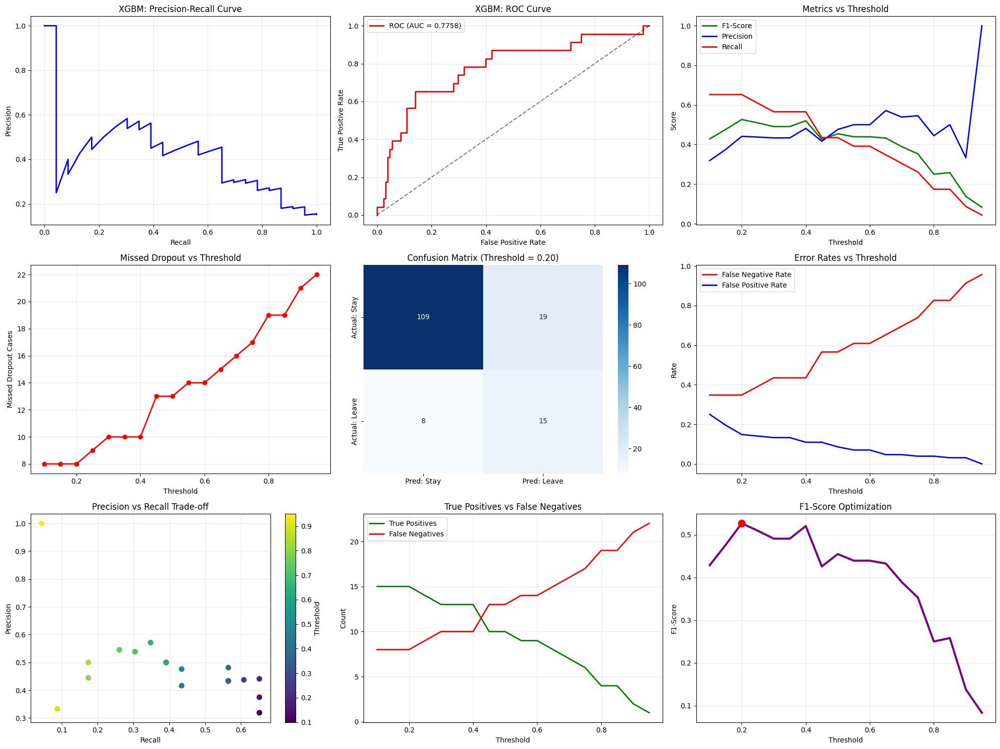


📈 IMPROVEMENT ANALYSIS:

🏆 BEST F1-SCORE THRESHOLD:
   Threshold: 0.200
   Improvement: F1 0.4545 → 0.5263 (+0.0718)
   Missed Dropout: 13 → 8 (+5)

🎯 MINIMUM MISSED Dropout THRESHOLD:
   Threshold: 0.100
   Missed Dropout: 13 → 8 (+5)
   F1-Score: 0.4545 → 0.4286 (-0.0260)

🔍 TOP 10 FEATURE IMPORTANCE:
----------------------------------------
                          feature  importance
          Second_sem_success_rate    0.275520
Curricular_units_2nd_sem_approved    0.112367
           First_sem_success_rate    0.041799
             Parent_education_gap    0.039615
             Min_parent_education    0.034371
Curricular_units_2nd_sem_enrolled    0.029669
                              GDP    0.029109
                Unemployment_rate    0.026632
                        Displaced    0.025197
                   Inflation_rate    0.023273

💼 BUSINESS SCENARIO RECOMMENDATIONS:

Cost Of Losing Student Low:
   Balanced approach - good overall performance
   Recommended Threshold: 0.200


In [16]:
import joblib
import os
from datetime import datetime

def tune_existing_lgbm(best_overall_model, X_train_balanced, y_train_balanced, X_test, y_test, save_path="models/"):
    """
    Threshold tuning untuk model XGBM yang sudah ditraining sebelumnya

    Parameters:
    best_overall_model: Model XGBM yang sudah ditraining
    X_train_balanced, y_train_balanced: Training data untuk cross-validation
    X_test, y_test: Test data untuk evaluasi
    save_path: Path untuk menyimpan model (default: "models/")
    """

    print("🚀 Starting Threshold Tuning for Pre-trained XGBM...")
    print("="*80)

    # Create save directory if it doesn't exist
    os.makedirs(save_path, exist_ok=True)

    # 1. Use existing trained model
    print("📈 Using Pre-trained XGBM Model...")
    xgb_model = best_overall_model

    # Get predictions
    y_proba = xgb_model.predict_proba(X_test)[:, 1]  # Probability for positive class (Dropout)
    y_pred_default = xgb_model.predict(X_test)  # Default threshold (0.5)

    # 2. Evaluate with default threshold
    print("\n📊 Default Performance (Threshold = 0.5):")
    print("-"*50)

    default_f1 = f1_score(y_test, y_pred_default)
    default_precision = precision_score(y_test, y_pred_default)
    default_recall = recall_score(y_test, y_pred_default)
    default_auc = roc_auc_score(y_test, y_proba)

    # Default confusion matrix
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred_default).ravel()

    print(f"AUC-ROC: {default_auc:.4f}")
    print(f"F1-Score: {default_f1:.4f}")
    print(f"Precision: {default_precision:.4f}")
    print(f"Recall: {default_recall:.4f}")
    print(f"Confusion Matrix: TN={tn}, FP={fp}, FN={fn}, TP={tp}")
    print(f"Missed Dropout (False Negatives): {fn}")

    # Cross-validation score
    cv_scores = cross_val_score(xgb_model, X_train_balanced, y_train_balanced,
                               cv=5, scoring='f1', n_jobs=-1)
    print(f"Cross-Val F1: {cv_scores.mean():.4f} (±{cv_scores.std():.4f})")

    # 3. Threshold Tuning Analysis
    print(f"\n🎯 Starting Threshold Tuning Analysis...")
    print("-"*50)

    metrics_df, optimal_thresholds = threshold_tuning_analysis(y_test, y_proba, "XGBM")

    # 4. Compare with default threshold
    print(f"\n📈 IMPROVEMENT ANALYSIS:")
    print("="*60)

    best_f1_threshold = optimal_thresholds['max_f1']
    min_missed_threshold = optimal_thresholds['min_missed_Dropout']

    print(f"\n🏆 BEST F1-SCORE THRESHOLD:")
    print(f"   Threshold: {best_f1_threshold['threshold']:.3f}")
    print(f"   Improvement: F1 {default_f1:.4f} → {best_f1_threshold['f1_score']:.4f} "
          f"(+{best_f1_threshold['f1_score'] - default_f1:.4f})")
    print(f"   Missed Dropout: {fn} → {int(best_f1_threshold['missed_Dropout'])} "
          f"({int(fn - best_f1_threshold['missed_Dropout']):+d})")

    print(f"\n🎯 MINIMUM MISSED Dropout THRESHOLD:")
    print(f"   Threshold: {min_missed_threshold['threshold']:.3f}")
    print(f"   Missed Dropout: {fn} → {int(min_missed_threshold['missed_Dropout'])} "
          f"({int(fn - min_missed_threshold['missed_Dropout']):+d})")
    print(f"   F1-Score: {default_f1:.4f} → {min_missed_threshold['f1_score']:.4f} "
          f"({min_missed_threshold['f1_score'] - default_f1:+.4f})")

    # 5. Feature Importance
    print(f"\n🔍 TOP 10 FEATURE IMPORTANCE:")
    print("-"*40)

    try:
        feature_importance = pd.DataFrame({
            'feature': X_train_balanced.columns,
            'importance': xgb_model.feature_importances_
        }).sort_values('importance', ascending=False)

        print(feature_importance.head(10).to_string(index=False))
    except Exception as e:
        print(f"Feature importance not available: {e}")
        print("Skipping feature importance analysis...")

    # 6. Recommendations for different business scenarios
    print(f"\n💼 BUSINESS SCENARIO RECOMMENDATIONS:")
    print("="*60)

    scenarios = {
        'cost_of_losing_student_low': {
            'threshold': best_f1_threshold['threshold'],
            'description': 'Balanced approach - good overall performance'
        },
        'cost_of_losing_student_high': {
            'threshold': min_missed_threshold['threshold'],
            'description': 'Conservative approach - minimize Dropout loss'
        },
        'school_budget_limited': {
            'threshold': 0.6,  # Higher threshold for fewer false positives
            'description': 'Focus on high-confidence predictions'
        }
    }

    for scenario, details in scenarios.items():
        thresh = details['threshold']
        # Find closest threshold in our analysis
        closest_idx = np.abs(metrics_df['threshold'] - thresh).idxmin()
        scenario_metrics = metrics_df.iloc[closest_idx]

        print(f"\n{scenario.replace('_', ' ').title()}:")
        print(f"   {details['description']}")
        print(f"   Recommended Threshold: {scenario_metrics['threshold']:.3f}")
        print(f"   Expected Results:")
        print(f"     - F1-Score: {scenario_metrics['f1_score']:.4f}")
        print(f"     - Precision: {scenario_metrics['precision']:.4f}")
        print(f"     - Recall: {scenario_metrics['recall']:.4f}")
        print(f"     - Missed Dropout: {int(scenario_metrics['missed_Dropout'])} students")
        print(f"     - False Positives: {int(scenario_metrics['fp'])} students")

    # 7. Save model with best F1 score and optimal threshold
    print(f"\n💾 SAVING MODEL WITH BEST F1 SCORE:")
    print("="*60)

    # Create timestamp for unique filename
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    # Prepare model package with all necessary information
    model_package = {
        'model': xgb_model,
        'optimal_threshold': best_f1_threshold['threshold'],
        'best_f1_score': best_f1_threshold['f1_score'],
        'model_performance': {
            'default_threshold': {
                'threshold': 0.5,
                'f1_score': default_f1,
                'precision': default_precision,
                'recall': default_recall,
                'auc_roc': default_auc
            },
            'optimized_threshold': {
                'threshold': best_f1_threshold['threshold'],
                'f1_score': best_f1_threshold['f1_score'],
                'precision': best_f1_threshold['precision'],
                'recall': best_f1_threshold['recall'],
                'missed_dropout': int(best_f1_threshold['missed_Dropout'])
            }
        },
        'feature_names': list(X_train_balanced.columns),
        'training_timestamp': timestamp,
        'cross_val_f1_mean': cv_scores.mean(),
        'cross_val_f1_std': cv_scores.std(),
        'metrics_df': metrics_df,
        'all_optimal_thresholds': optimal_thresholds
    }

    # Save the complete model package
    model_filename = f"best_f1_xgbm_model_{timestamp}.pkl"
    model_filepath = os.path.join(save_path, model_filename)

    try:
        joblib.dump(model_package, model_filepath)
        print(f"✅ Model successfully saved to: {model_filepath}")
        print(f"📈 Best F1 Score: {best_f1_threshold['f1_score']:.4f}")
        print(f"🎯 Optimal Threshold: {best_f1_threshold['threshold']:.3f}")
        print(f"📊 Model AUC-ROC: {default_auc:.4f}")

        # Also save just the model for quick loading
        model_only_filename = f"xgbm_model_only_{timestamp}.pkl"
        model_only_filepath = os.path.join(save_path, model_only_filename)
        joblib.dump(xgb_model, model_only_filepath)
        print(f"✅ Model (only) also saved to: {model_only_filepath}")

    except Exception as e:
        print(f"❌ Error saving model: {e}")
        model_filepath = None

    print(f"\n📋 SAVED MODEL CONTENTS:")
    print(f"   - Trained XGBoost model")
    print(f"   - Optimal threshold ({best_f1_threshold['threshold']:.3f})")
    print(f"   - Performance metrics")
    print(f"   - Feature names")
    print(f"   - Complete threshold analysis")
    print(f"   - Cross-validation scores")

    return xgb_model, metrics_df, optimal_thresholds, y_proba, model_filepath

def load_saved_model(model_filepath):
    """
    Load the saved model package

    Parameters:
    model_filepath: Path to the saved model file

    Returns:
    model_package: Dictionary containing model and all metadata
    """
    try:
        model_package = joblib.load(model_filepath)
        print(f"✅ Model successfully loaded from: {model_filepath}")
        print(f"📈 Best F1 Score: {model_package['best_f1_score']:.4f}")
        print(f"🎯 Optimal Threshold: {model_package['optimal_threshold']:.3f}")
        print(f"📅 Training Date: {model_package['training_timestamp']}")
        return model_package
    except Exception as e:
        print(f"❌ Error loading model: {e}")
        return None

def predict_with_saved_model(model_package, X_new, use_optimal_threshold=True):
    """
    Make predictions using the saved model

    Parameters:
    model_package: Loaded model package from load_saved_model()
    X_new: New data to predict
    use_optimal_threshold: Whether to use optimal threshold or default (0.5)

    Returns:
    predictions, probabilities
    """
    model = model_package['model']

    # Get probabilities
    y_proba = model.predict_proba(X_new)[:, 1]

    if use_optimal_threshold:
        threshold = model_package['optimal_threshold']
        y_pred = (y_proba >= threshold).astype(int)
        print(f"🎯 Using optimal threshold: {threshold:.3f}")
    else:
        y_pred = model.predict(X_new)
        print(f"🎯 Using default threshold: 0.5")

    return y_pred, y_proba

def threshold_tuning_analysis(y_true, y_proba, model_name="XGBM"):
    """
    Melakukan analisis threshold tuning untuk model prediksi Dropout
    """

    # Calculate metrics for different thresholds
    thresholds = np.arange(0.1, 1.0, 0.05)
    metrics_data = []

    for threshold in thresholds:
        y_pred = (y_proba >= threshold).astype(int)

        # Calculate metrics
        f1 = f1_score(y_true, y_pred, zero_division=0)
        precision_score_val = precision_score(y_true, y_pred, zero_division=0)
        recall_score_val = recall_score(y_true, y_pred, zero_division=0)

        # Confusion matrix
        cm = confusion_matrix(y_true, y_pred)
        if cm.shape == (2, 2):
            tn, fp, fn, tp = cm.ravel()
        else:
            # Handle edge cases where one class is missing
            tn = fp = fn = tp = 0
            if len(np.unique(y_pred)) == 0:
                tn = len(y_true[y_true == 0])
                fn = len(y_true[y_true == 1])
            elif len(np.unique(y_pred)) == 1:
                if np.unique(y_pred)[0] == 0:  # All predicted as 0
                    tn = len(y_true[y_true == 0])
                    fn = len(y_true[y_true == 1])
                else:  # All predicted as 1
                    fp = len(y_true[y_true == 0])
                    tp = len(y_true[y_true == 1])

        # Ensure all values are integers
        tn, fp, fn, tp = int(tn), int(fp), int(fn), int(tp)

        # Business metrics
        false_negative_rate = fn / (fn + tp) if (fn + tp) > 0 else 0
        false_positive_rate = fp / (fp + tn) if (fp + tn) > 0 else 0

        metrics_data.append({
            'threshold': threshold,
            'f1_score': f1,
            'precision': precision_score_val,
            'recall': recall_score_val,
            'tn': tn,
            'fp': fp,
            'fn': fn,
            'tp': tp,
            'false_negative_rate': false_negative_rate,
            'false_positive_rate': false_positive_rate,
            'missed_Dropout': fn  # This is already an integer
        })

    metrics_df = pd.DataFrame(metrics_data)

    # Find optimal thresholds
    optimal_thresholds = {
        'max_f1': metrics_df.loc[metrics_df['f1_score'].idxmax()],
        'balanced_precision_recall': metrics_df.loc[(metrics_df['precision'] - metrics_df['recall']).abs().idxmin()],
        'min_missed_Dropout': metrics_df.loc[metrics_df['missed_Dropout'].idxmin()],
        'recall_80_plus': metrics_df[metrics_df['recall'] >= 0.8].iloc[0] if len(metrics_df[metrics_df['recall'] >= 0.8]) > 0 else None
    }

    # Create visualizations
    create_threshold_visualizations(metrics_df, y_true, y_proba, optimal_thresholds, model_name)

    return metrics_df, optimal_thresholds

def create_threshold_visualizations(metrics_df, y_true, y_proba, optimal_thresholds, model_name):
    """
    Create comprehensive visualizations for threshold analysis
    """

    # Precision-Recall and ROC curves
    precision, recall, pr_thresholds = precision_recall_curve(y_true, y_proba)
    fpr, tpr, roc_thresholds = roc_curve(y_true, y_proba)

    plt.figure(figsize=(20, 15))

    # Plot 1: Precision-Recall Curve
    plt.subplot(3, 3, 1)
    plt.plot(recall, precision, 'b-', linewidth=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'{model_name}: Precision-Recall Curve')
    plt.grid(True, alpha=0.3)

    # Plot 2: ROC Curve
    plt.subplot(3, 3, 2)
    auc_score = roc_auc_score(y_true, y_proba)
    plt.plot(fpr, tpr, 'r-', linewidth=2, label=f'ROC (AUC = {auc_score:.4f})')
    plt.plot([0, 1], [0, 1], 'k--', alpha=0.5)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{model_name}: ROC Curve')
    plt.legend()
    plt.grid(True, alpha=0.3)

    # Plot 3: Metrics vs Threshold
    plt.subplot(3, 3, 3)
    plt.plot(metrics_df['threshold'], metrics_df['f1_score'], 'g-', label='F1-Score', linewidth=2)
    plt.plot(metrics_df['threshold'], metrics_df['precision'], 'b-', label='Precision', linewidth=2)
    plt.plot(metrics_df['threshold'], metrics_df['recall'], 'r-', label='Recall', linewidth=2)
    plt.xlabel('Threshold')
    plt.ylabel('Score')
    plt.title('Metrics vs Threshold')
    plt.legend()
    plt.grid(True, alpha=0.3)

    # Plot 4: Missed Dropout vs Threshold
    plt.subplot(3, 3, 4)
    plt.plot(metrics_df['threshold'], metrics_df['missed_Dropout'], 'ro-', linewidth=2)
    plt.xlabel('Threshold')
    plt.ylabel('Missed Dropout Cases')
    plt.title('Missed Dropout vs Threshold')
    plt.grid(True, alpha=0.3)

    # Plot 5: Confusion Matrix for Optimal F1
    plt.subplot(3, 3, 5)
    opt_f1 = optimal_thresholds['max_f1']
    cm_data = [[int(opt_f1['tn']), int(opt_f1['fp'])], [int(opt_f1['fn']), int(opt_f1['tp'])]]
    sns.heatmap(cm_data, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Pred: Stay', 'Pred: Leave'],
                yticklabels=['Actual: Stay', 'Actual: Leave'])
    plt.title(f'Confusion Matrix (Threshold = {opt_f1["threshold"]:.2f})')

    # Plot 6: Error Rates
    plt.subplot(3, 3, 6)
    plt.plot(metrics_df['threshold'], metrics_df['false_negative_rate'], 'r-',
             label='False Negative Rate', linewidth=2)
    plt.plot(metrics_df['threshold'], metrics_df['false_positive_rate'], 'b-',
             label='False Positive Rate', linewidth=2)
    plt.xlabel('Threshold')
    plt.ylabel('Rate')
    plt.title('Error Rates vs Threshold')
    plt.legend()
    plt.grid(True, alpha=0.3)

    # Plot 7: Precision vs Recall Trade-off
    plt.subplot(3, 3, 7)
    scatter = plt.scatter(metrics_df['recall'], metrics_df['precision'],
                         c=metrics_df['threshold'], cmap='viridis', s=50)
    plt.colorbar(scatter, label='Threshold')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision vs Recall Trade-off')
    plt.grid(True, alpha=0.3)

    # Plot 8: TP and FN Analysis
    plt.subplot(3, 3, 8)
    plt.plot(metrics_df['threshold'], metrics_df['tp'], 'g-', label='True Positives', linewidth=2)
    plt.plot(metrics_df['threshold'], metrics_df['fn'], 'r-', label='False Negatives', linewidth=2)
    plt.xlabel('Threshold')
    plt.ylabel('Count')
    plt.title('True Positives vs False Negatives')
    plt.legend()
    plt.grid(True, alpha=0.3)

    # Plot 9: F1-Score Optimization
    plt.subplot(3, 3, 9)
    plt.plot(metrics_df['threshold'], metrics_df['f1_score'], 'purple', linewidth=3)
    max_f1_idx = metrics_df['f1_score'].idxmax()
    plt.scatter(metrics_df.loc[max_f1_idx, 'threshold'],
                metrics_df.loc[max_f1_idx, 'f1_score'],
                color='red', s=100, zorder=5)
    plt.xlabel('Threshold')
    plt.ylabel('F1-Score')
    plt.title(f'F1-Score Optimization')
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

def apply_optimal_threshold(model, X_test, optimal_threshold):
    """
    Apply optimal threshold to make predictions
    """
    y_proba = model.predict_proba(X_test)[:, 1]
    y_pred_optimal = (y_proba >= optimal_threshold).astype(int)
    return y_pred_optimal, y_proba

# Contoh penggunaan lengkap:
def run_complete_analysis(best_overall_model, X_train_balanced, y_train_balanced, X_test, y_test, save_path="models/"):
    """
    Jalankan analisis lengkap threshold tuning untuk model yang sudah ditraining
    """

    # Gunakan model yang sudah ditraining dan lakukan threshold tuning
    xgb_model, metrics_df, optimal_thresholds, y_proba, model_filepath = tune_existing_lgbm(
        best_overall_model, X_train_balanced, y_train_balanced, X_test, y_test, save_path
    )

    # Apply optimal threshold
    optimal_threshold = optimal_thresholds['max_f1']['threshold']
    y_pred_optimal, _ = apply_optimal_threshold(xgb_model, X_test, optimal_threshold)

    print(f"\n🎯 FINAL RESULTS WITH OPTIMAL THRESHOLD ({optimal_threshold:.3f}):")
    print("="*60)

    final_f1 = f1_score(y_test, y_pred_optimal)
    final_precision = precision_score(y_test, y_pred_optimal)
    final_recall = recall_score(y_test, y_pred_optimal)

    print(f"Optimized F1-Score: {final_f1:.4f}")
    print(f"Optimized Precision: {final_precision:.4f}")
    print(f"Optimized Recall: {final_recall:.4f}")

    # Final confusion matrix
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred_optimal).ravel()
    print(f"Final Confusion Matrix: TN={tn}, FP={fp}, FN={fn}, TP={tp}")
    print(f"Final Missed Dropout: {fn}")

    return xgb_model, optimal_threshold, metrics_df, model_filepath

# Example usage with model saving:
xgb_model, optimal_threshold, metrics_df, saved_model_path = run_complete_analysis(
    best_overall_model, X_train_balanced, y_train_balanced, X_test, y_test, save_path="models/"
)

# Apply optimal threshold
y_pred_optimal, y_proba_optimal = apply_optimal_threshold(
    best_overall_model, X_test, optimal_threshold
)

loaded_model_package = load_saved_model(saved_model_path)